# IMPORTING LIBRARIES

In [ ]:
# Data Manipulation
import pandas as pd  # For data manipulation and analysis
import numpy as np  # For numerical operations

# Data Visualization
import matplotlib.pyplot as plt  # For plotting graphs
import seaborn as sns  # For advanced visualization
import missingno as msno  # For visualizing missing data patterns

# Machine Learning and Preprocessing
from sklearn.model_selection import KFold, GridSearchCV  # For cross-validation and hyperparameter tuning
from sklearn.metrics import roc_auc_score, accuracy_score  # For model evaluation metrics
from sklearn.preprocessing import LabelEncoder  # For encoding categorical variables
from sklearn.decomposition import PCA  # For dimensionality reduction

# Machine Learning Models
from lightgbm import LGBMClassifier, log_evaluation  # For LightGBM model
from xgboost import XGBClassifier  # For XGBoost model
from sklearn.ensemble import RandomForestClassifier  # For Random Forest model
from sklearn.linear_model import LogisticRegression  # For Logistic Regression model

# Utility
import gc  # For garbage collection to manage memory usage
from contextlib import contextmanager  # For creating context managers
import time  # For tracking execution time

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')  # To suppress warnings in output


In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Loading data set

In [ ]:
data_path = "/kaggle/input/ieee-fraud-detection/"
train_transaction = pd.read_csv(data_path + "train_transaction.csv")
train_identity = pd.read_csv(data_path + "train_identity.csv")
test_transaction = pd.read_csv(data_path + "test_transaction.csv")
test_identity = pd.read_csv(data_path + "test_identity.csv")
sample_submission = pd.read_csv(data_path + "sample_submission.csv")

In [ ]:
pd.set_option('display.max_rows', 999)
pd.set_option('display.max_columns',700)
pd.set_option('display.float_format', lambda x: '%.3f' % x)


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

## Memory reduction


In [ ]:
fix_col_name = {test_col: train_col for test_col, train_col in zip(test_identity.columns, train_identity.columns)}
test_identity.rename(columns=fix_col_name, inplace=True)

train_transaction = reduce_memory_usage(train_transaction)
train_identity = reduce_memory_usage(train_identity)
test_transaction = reduce_memory_usage(test_transaction)
test_identity = reduce_memory_usage(test_identity)

train = train_transaction.merge(train_identity, on='TransactionID', how='left')
test = test_transaction.merge(test_identity, on='TransactionID', how='left')

train_test = pd.concat([train, test], ignore_index=True)

print(f"Train dataset: {train.shape[0]} rows, {train.shape[1]} columns")
print(f"Test dataset: {test.shape[0]} rows, {test.shape[1]} columns")


del train_transaction, train_identity, test_transaction, test_identity
gc.collect()



Memory usage of dataframe is 1775.15 MB
Memory usage after optimization is 542.35 MB
Decreased by 69.4%
Memory usage of dataframe is 45.12 MB
Memory usage after optimization is 25.86 MB
Decreased by 42.7%
Memory usage of dataframe is 1519.24 MB
Memory usage after optimization is 472.59 MB
Decreased by 68.9%
Memory usage of dataframe is 44.39 MB
Memory usage after optimization is 25.44 MB
Decreased by 42.7%
Train dataset: 590540 rows, 434 columns
Test dataset: 506691 rows, 433 columns


0

In [ ]:
train_test = train_test.copy()
train = train.copy()
test = test.copy()

# EDA
## Information of Variables



https://www.kaggle.com/c/ieee-fraud-detection/discussion/101203



``TransactionDT``: timedelta from a given reference datetime (not an actual timestamp)



``TransactionAMT``: transaction payment amount in USD



``dist``: May be the distance from addresses



``C1-C14``: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.



``D1-D15``: timedelta, such as days between previous transaction, etc.



``V1`` - ``V339``: Vesta engineered rich features, including ranking, counting, and other entity relations.



``id_01`` - ``id_11``(In identity table)



**Categorical Variables**



From **Transaction** Table:



``ProductCD``: product code, the product for each transaction



``card1`` - ``card6``: payment card information, such as card type, card category, issue bank, country, etc.



``addr1``, ``addr2``:

both are for purchaser,

addr1 as billing region,

addr2 as billing country



``Pemaildomain``, ``Remaildomain``: purchaser and recipient email domain



``M1`` - ``M9``: match, such as names on card and address, etc.



From **Identity** Table:



Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions.

They're collected by Vesta’s fraud protection system and digital security partners.



``id12`` - ``id38``, ``DeviceType``, ``DeviceInfo``



In [ ]:
print(train.shape)


(590540, 434)


In [ ]:
print(train.dtypes)

TransactionID       int32
isFraud              int8
TransactionDT       int32
TransactionAmt    float16
ProductCD          object
card1               int16
card2             float16
card3             float16
card4              object
card5             float16
card6              object
addr1             float16
addr2             float16
dist1             float16
dist2             float16
P_emaildomain      object
R_emaildomain      object
C1                float16
C2                float16
C3                float16
C4                float16
C5                float16
C6                float16
C7                float16
C8                float16
C9                float16
C10               float16
C11               float16
C12               float16
C13               float16
C14               float16
D1                float16
D2                float16
D3                float16
D4                float16
D5                float16
D6                float16
D7                float16
D8          

In [ ]:
missing = train.isnull().sum()
if missing.sum() > 0:
    print(missing[missing > 0])
else:
    print("No missing values.")


card2              8933
card3              1565
card4              1577
card5              4259
card6              1571
addr1             65706
addr2             65706
dist1            352271
dist2            552913
P_emaildomain     94456
R_emaildomain    453249
D1                 1269
D2               280797
D3               262878
D4               168922
D5               309841
D6               517353
D7               551623
D8               515614
D9               515614
D10               76022
D11              279287
D12              525823
D13              528588
D14              528353
D15               89113
M1               271100
M2               271100
M3               271100
M4               281444
M5               350482
M6               169360
M7               346265
M8               346252
M9               346252
V1               279287
V2               279287
V3               279287
V4               279287
V5               279287
V6               279287
V7              

In [ ]:
print(train.head(5))


   TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  card1  \
0        2987000        0          86400          68.500         W  13926   
1        2987001        0          86401          29.000         W   2755   
2        2987002        0          86469          59.000         W   4663   
3        2987003        0          86499          50.000         W  18132   
4        2987004        0          86506          50.000         H   4497   

    card2   card3       card4   card5   card6   addr1  addr2   dist1  dist2  \
0     NaN 150.000    discover 142.000  credit 315.000 87.000  19.000    NaN   
1 404.000 150.000  mastercard 102.000  credit 325.000 87.000     NaN    NaN   
2 490.000 150.000        visa 166.000   debit 330.000 87.000 287.000    NaN   
3 567.000 150.000  mastercard 117.000   debit 476.000 87.000     NaN    NaN   
4 514.000 150.000  mastercard 102.000  credit 420.000 87.000     NaN    NaN   

  P_emaildomain R_emaildomain    C1    C2    C3    C4    C5   

In [ ]:
print(train.describe(include='all', percentiles=[.25, .5, .75]).T)


                    count unique                   top    freq        mean  \
TransactionID  590540.000    NaN                   NaN     NaN 3282269.500   
isFraud        590540.000    NaN                   NaN     NaN       0.035   
TransactionDT  590540.000    NaN                   NaN     NaN 7372311.310   
TransactionAmt 590540.000    NaN                   NaN     NaN         NaN   
ProductCD          590540      5                     W  439670         NaN   
card1          590540.000    NaN                   NaN     NaN    9898.735   
card2          581607.000    NaN                   NaN     NaN         NaN   
card3          588975.000    NaN                   NaN     NaN         NaN   
card4              588963      4                  visa  384767         NaN   
card5          586281.000    NaN                   NaN     NaN         NaN   
card6              588969      4                 debit  439938         NaN   
addr1          524834.000    NaN                   NaN     NaN  

In [ ]:
na_percentage = (missing / len(train)) * 100
na_percentage = na_percentage[na_percentage > 0].sort_values(ascending=False)
if not na_percentage.empty:
    print(na_percentage)
else:
    print("No missing values.")


id_24           99.196
id_25           99.131
id_07           99.127
id_08           99.127
id_21           99.126
id_26           99.126
id_27           99.125
id_23           99.125
id_22           99.125
dist2           93.628
D7              93.410
id_18           92.361
D13             89.509
D14             89.469
D12             89.041
id_03           88.769
id_04           88.769
D6              87.607
id_33           87.589
id_10           87.312
id_09           87.312
D8              87.312
D9              87.312
id_30           86.865
id_32           86.862
id_34           86.825
id_14           86.446
V155            86.124
V138            86.124
V156            86.124
V157            86.124
V158            86.124
V154            86.124
V153            86.124
V161            86.124
V162            86.124
V139            86.124
V149            86.124
V147            86.124
V146            86.124
V163            86.124
V148            86.124
V142            86.124
V141       

### Target variable

##################### Fraudulent Transactions #####################
Number of Fraudulent Transactions: 20663
Number of Non-Fraudulent Transactions: 569877

##################### Class Distribution #####################
isFraud
0   0.965
1   0.035
Name: proportion, dtype: float64

##################### Class Distribution (Percentage) #####################
isFraud
0   96.501
1    3.499
Name: proportion, dtype: float64


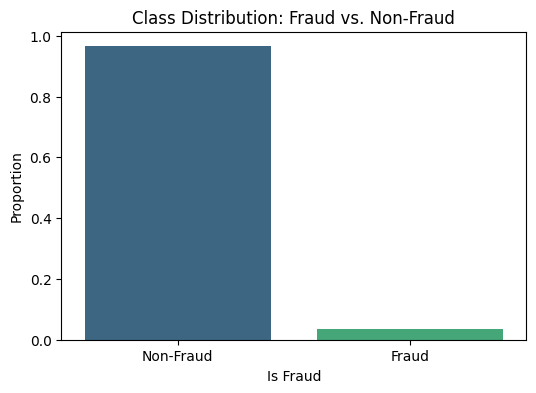

In [ ]:
# Filter the training data into fraudulent and non-fraudulent transactions
train_fraud = train[train['isFraud'] == 1]  # Fraudulent transactions
train_non_fraud = train[train['isFraud'] == 0]  # Non-fraudulent transactions

# Print the number of fraudulent and non-fraudulent transactions
print("##################### Fraudulent Transactions #####################")
print(f"Number of Fraudulent Transactions: {train_fraud.shape[0]}")
print(f"Number of Non-Fraudulent Transactions: {train_non_fraud.shape[0]}")

# Check the distribution of the 'isFraud' column
print("\n##################### Class Distribution #####################")
class_distribution = train['isFraud'].value_counts(normalize=True)
print(class_distribution)

# Optionally, display the class distribution as percentages
print("\n##################### Class Distribution (Percentage) #####################")
print(class_distribution * 100)

# Visualize the class distribution
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.barplot(x=class_distribution.index, y=class_distribution.values, palette="viridis")
plt.title("Class Distribution: Fraud vs. Non-Fraud")
plt.xlabel("Is Fraud")
plt.ylabel("Proportion")
plt.xticks([0, 1], labels=["Non-Fraud", "Fraud"])
plt.show()


## TransactionDT

In [ ]:
train_span = (train['TransactionDT'].max() - train['TransactionDT'].min())/(3600*24)
test_span = (test['TransactionDT'].max() - test['TransactionDT'].min())/(3600*24)
total_span = (test['TransactionDT'].max() - train['TransactionDT'].min())/(3600*24)
gap_span = (test['TransactionDT'].min() - train['TransactionDT'].max())/(3600*24)
print('Time span of Train dataset is {:.2f} days'.format(train_span))
print('Time span of Test dataset is {:.2f} days'.format(test_span))
print('Time span of Total dataset is {:.2f} days'.format(total_span))
print('Time gap between train and test is {:.2f} days'.format(gap_span))

Time span of Train dataset is 182.00 days
Time span of Test dataset is 183.00 days
Time span of Total dataset is 395.00 days
Time gap between train and test is 30.00 days


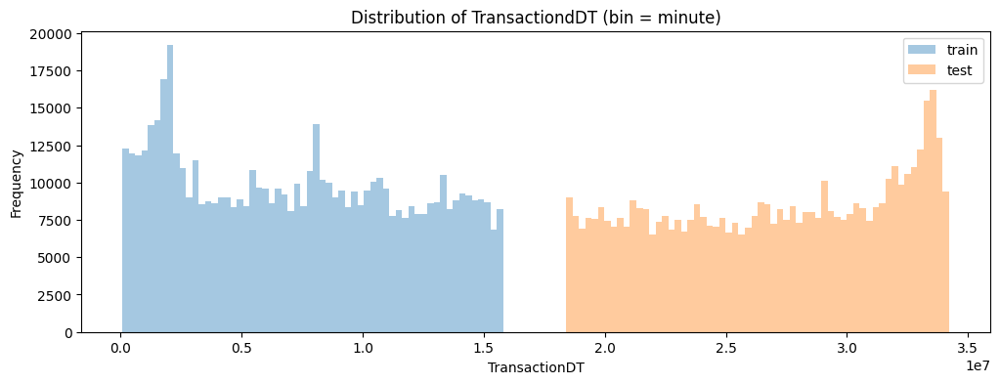

In [ ]:
plt.figure(figsize=(12,4))
sns.distplot(train['TransactionDT'],kde=False,bins=60)
sns.distplot(test['TransactionDT'],kde=False,bins=60)
plt.legend(['train', 'test'])
plt.ylabel('Frequency')
plt.title('Distribution of TransactiondDT (bin = minute)');
plt.show()

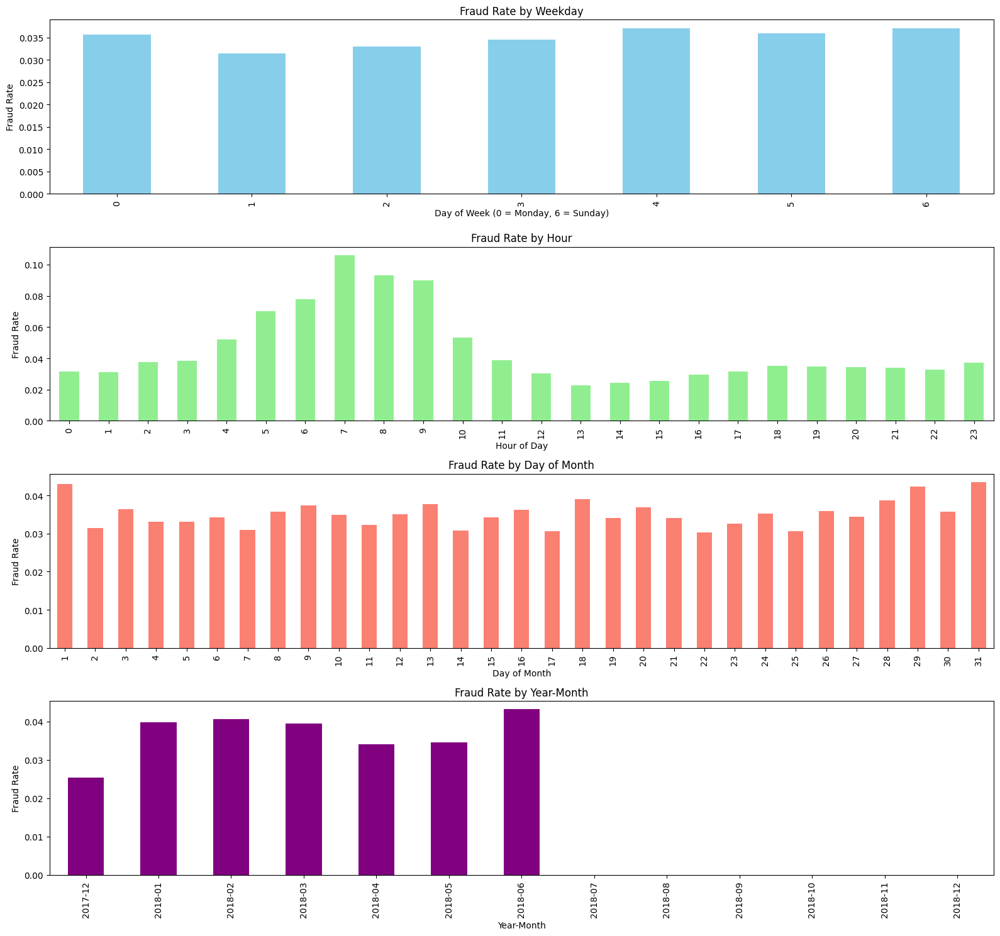

In [ ]:
import time
import datetime

START_DATE = '2017-12-01'
startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")

train_test['New_Date'] = train_test['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))
train_test['New_Date_YMD'] = train_test['New_Date'].dt.strftime('%Y-%m-%d')  # Simplified formatting
train_test['New_Date_YearMonth'] = train_test['New_Date'].dt.strftime('%Y-%m')
train_test['New_Date_Weekday'] = train_test['New_Date'].dt.dayofweek
train_test['New_Date_Hour'] = train_test['New_Date'].dt.hour
train_test['New_Date_Day'] = train_test['New_Date'].dt.day

fig, ax = plt.subplots(4, 1, figsize=(16, 15))

train_test.groupby('New_Date_Weekday')['isFraud'].mean().plot.bar(ax=ax[0], color='skyblue')
ax[0].set_title("Fraud Rate by Weekday")
ax[0].set_xlabel("Day of Week (0 = Monday, 6 = Sunday)")
ax[0].set_ylabel("Fraud Rate")

train_test.groupby('New_Date_Hour')['isFraud'].mean().plot.bar(ax=ax[1], color='lightgreen')
ax[1].set_title("Fraud Rate by Hour")
ax[1].set_xlabel("Hour of Day")
ax[1].set_ylabel("Fraud Rate")

train_test.groupby('New_Date_Day')['isFraud'].mean().plot.bar(ax=ax[2], color='salmon')
ax[2].set_title("Fraud Rate by Day of Month")
ax[2].set_xlabel("Day of Month")
ax[2].set_ylabel("Fraud Rate")

train_test.groupby('New_Date_YearMonth')['isFraud'].mean().plot.bar(ax=ax[3], color='purple')
ax[3].set_title("Fraud Rate by Year-Month")
ax[3].set_xlabel("Year-Month")
ax[3].set_ylabel("Fraud Rate")

plt.tight_layout()
plt.show()

## TransactionAmt


In [ ]:
train['TransactionAmt_Log'] = np.log1p(train['TransactionAmt'])

quantiles_total = train['TransactionAmt'].quantile([.01, .1, .25, .5, .75, .9, .99]).reset_index()
quantiles_fraud = train_fraud['TransactionAmt'].quantile([.01, .1, .25, .5, .75, .9, .99]).reset_index()
quantiles_non_fraud = train_non_fraud['TransactionAmt'].quantile([.01, .1, .25, .5, .75, .9, .99]).reset_index()

quantiles_comparison = pd.concat(
    [quantiles_total, quantiles_fraud, quantiles_non_fraud],
    axis=1,
    keys=['Total', 'Fraud', 'No Fraud']
)

print("##################### Quantile Comparison #####################")
print(quantiles_comparison)


##################### Quantile Comparison #####################
  Total                Fraud                No Fraud               
  index TransactionAmt index TransactionAmt    index TransactionAmt
0 0.010          9.242 0.010          6.739    0.010          9.512
1 0.100         25.953 0.100         18.938    0.100         26.312
2 0.250         43.312 0.250         35.031    0.250         43.969
3 0.500         68.750 0.500         75.000    0.500         68.500
4 0.750        125.000 0.750        161.000    0.750        120.000
5 0.900        275.250 0.900        335.000    0.900        267.100
6 0.990       1104.000 0.990        994.000    0.990       1104.000


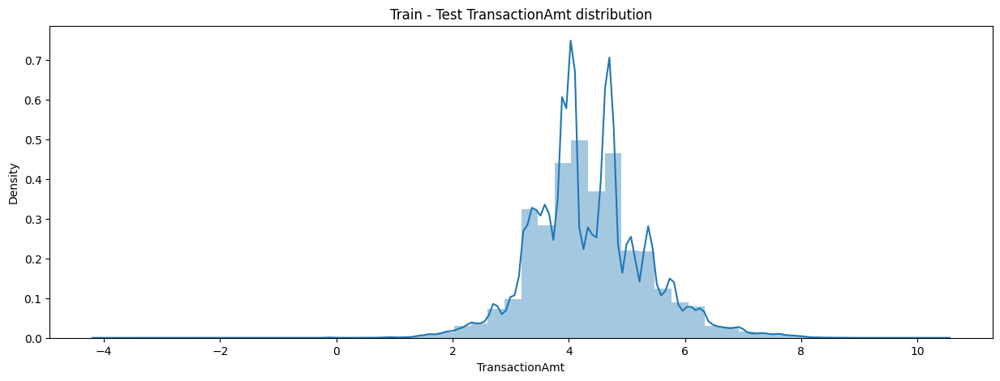

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(train_test["TransactionAmt"].apply(np.log))
plt.title('Train - Test TransactionAmt distribution')
plt.show()

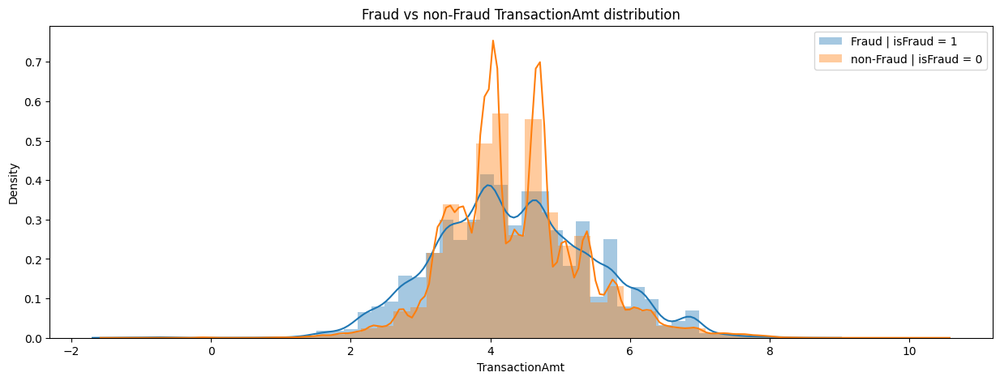

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(train_fraud["TransactionAmt"].apply(np.log), label = 'Fraud | isFraud = 1')
sns.distplot(train_non_fraud["TransactionAmt"].apply(np.log), label = 'non-Fraud | isFraud = 0')
plt.title('Fraud vs non-Fraud TransactionAmt distribution')
plt.legend()
plt.show()

New_TransactionAmt_Bin
(0.25, 24.0]       0.071
(24.0, 29.5]       0.032
(29.5, 35.938]     0.029
(35.938, 47.0]     0.041
(47.0, 50.0]       0.022
(50.0, 57.938]     0.018
(57.938, 59.0]     0.021
(59.0, 77.938]     0.044
(77.938, 100.0]    0.034
(100.0, 107.938]   0.014
(107.938, 117.0]   0.024
(117.0, 160.0]     0.043
(160.0, 226.0]     0.036
(226.0, 335.0]     0.049
(335.0, 31936.0]   0.051
Name: isFraud, dtype: float64


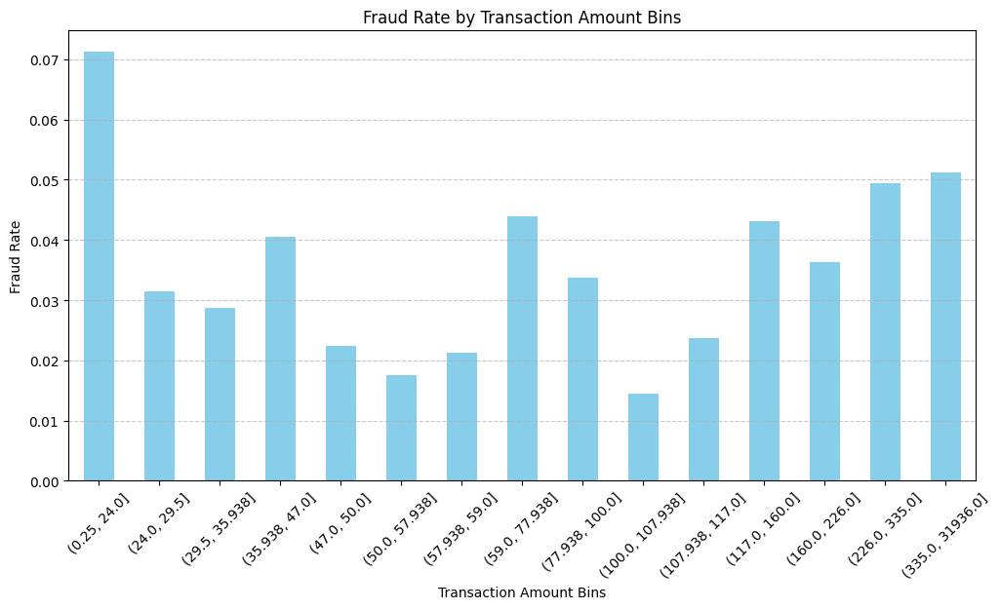

In [ ]:
train['TransactionAmt'] = train['TransactionAmt'].astype('float32')

train['New_TransactionAmt_Bin'] = pd.qcut(train['TransactionAmt'], 15)

fraud_rate_by_bin = train.groupby('New_TransactionAmt_Bin')['isFraud'].mean()
print(fraud_rate_by_bin)

fraud_rate_by_bin.plot(kind='bar', figsize=(12, 6), color='skyblue')
plt.title("Fraud Rate by Transaction Amount Bins")
plt.xlabel("Transaction Amount Bins")
plt.ylabel("Fraud Rate")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


## Dist1 Dist2


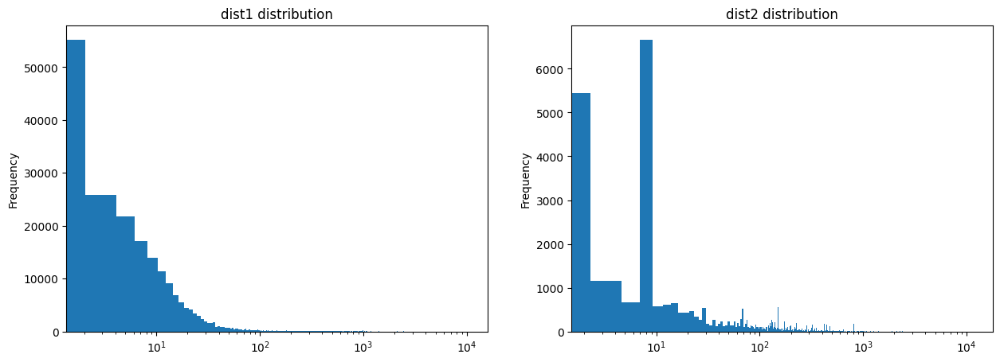

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
train['dist1'].plot(kind='hist',bins=5000,ax=ax1,title='dist1 distribution',logx=True)
train['dist2'].plot(kind='hist',bins=5000,ax=ax2,title='dist2 distribution',logx=True)
plt.show()

## Categorical feature

In [ ]:
def get_categorical_feature_details(df, cat_cols):

    cat_detail_dict = {col: df[col].nunique() for col in cat_cols}

    cat_detail_df = pd.DataFrame.from_dict(cat_detail_dict, orient='index', columns=['Unique Values'])

    print(f"There are {len(cat_cols)} categorical columns.")
    print(cat_detail_df)

    return cat_detail_df

cat_features = [
    'isFraud', 'ProductCD', 'addr1', 'addr2', 'P_emaildomain',
    'R_emaildomain', 'DeviceType', 'DeviceInfo'
]
all_cat_features = cat_features + [f'card{i}' for i in range(1, 7)] + [f'M{i}' for i in range(1, 10)] + [f'id_{i}' for i in range(12, 39)]

cat_feature_details = get_categorical_feature_details(train_test, cat_features)


There are 8 categorical columns.
               Unique Values
isFraud                    2
ProductCD                  5
addr1                    441
addr2                     93
P_emaildomain             60
R_emaildomain             60
DeviceType                 2
DeviceInfo              2799


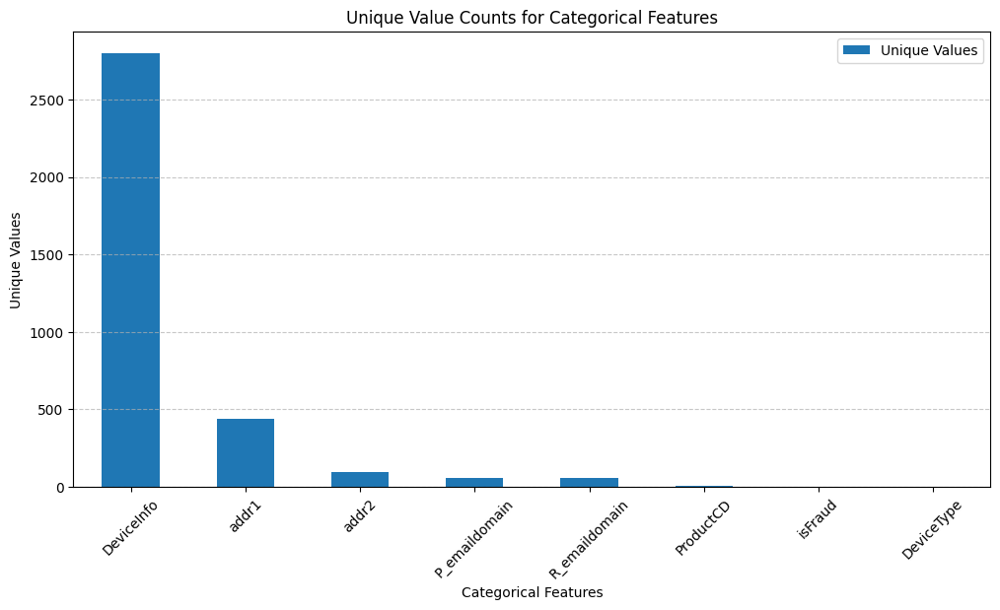

In [ ]:
cat_feature_details.sort_values(by='Unique Values', ascending=False).plot.bar(figsize=(12, 6))
plt.title("Unique Value Counts for Categorical Features")
plt.xlabel("Categorical Features")
plt.ylabel("Unique Values")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


## ProductCd

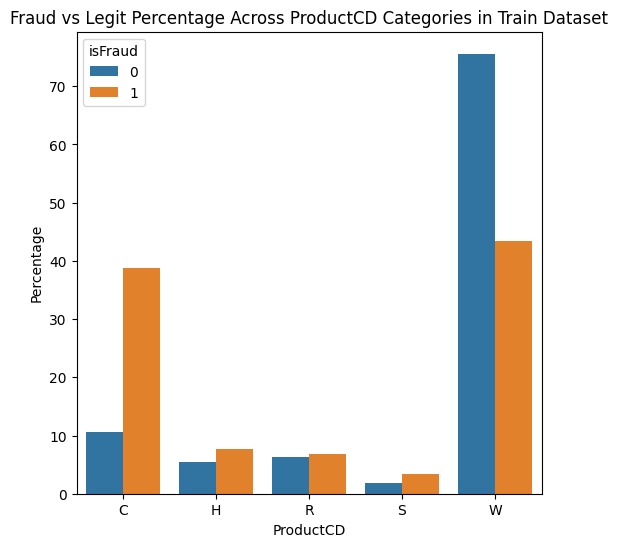

In [ ]:
product_cd_percentage = (
    train.groupby(['isFraud'])['ProductCD']
    .value_counts(normalize=True)
    .rename('percentage')
    .mul(100)
    .reset_index()
    .sort_values('ProductCD')
)

plt.figure(figsize=(6, 6))
sns.barplot(
    x="ProductCD",
    y="percentage",
    hue="isFraud",
    data=product_cd_percentage,

)
plt.title('Fraud vs Legit Percentage Across ProductCD Categories in Train Dataset')
plt.xlabel('ProductCD')
plt.ylabel('Percentage')
plt.show()

## addr1 and addr2 - Masked Billing Region and Country

om the graph above, we observe that if a transaction is fraudulent, there is a 40% chance it belongs to Product C (though the reverse cannot be inferred). Given that only 10% of legitimate transactions are associated with Product C, the likelihood of fraud increases significantly when the product is C

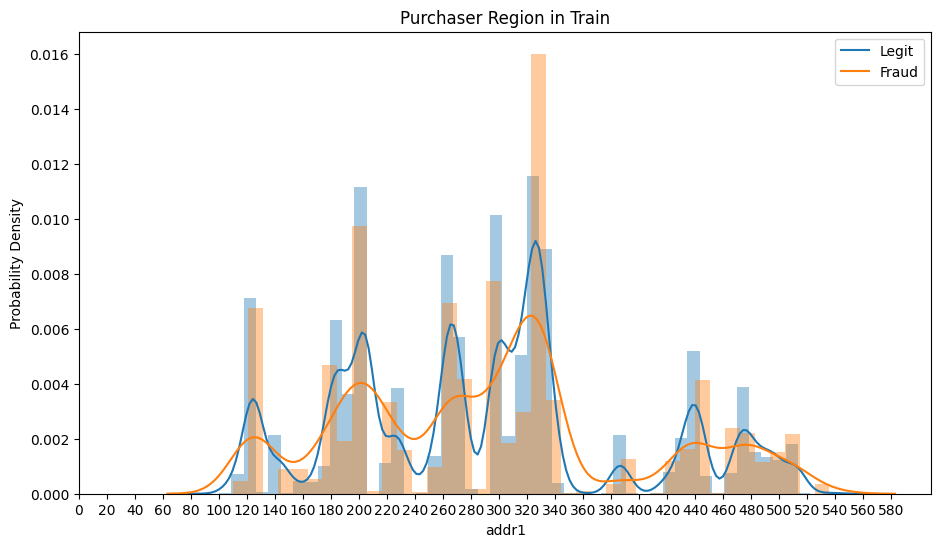

In [ ]:
plt.figure(figsize=(11,6))
sns.distplot(train[(train['isFraud']==0) & (~train['addr1'].isnull())]['addr1'])
sns.distplot(train[(train['isFraud']==1) & (~train['addr1'].isnull())]['addr1'])
plt.legend(['Legit','Fraud'])
plt.xticks(np.arange(0, 600, 20))
plt.ylabel('Probability Density')
plt.title('Purchaser Region in Train')
plt.show()

Apart from addresses 87, 60, and 96, the sample size for each address is insufficient.

In [ ]:
train.loc[train['addr1'].isin(train['addr1'].value_counts()[train['addr1'].value_counts() <= 5000 ].index), 'addr1'] = "Others"
train.loc[train['addr2'].isin(train['addr2'].value_counts()[train['addr2'].value_counts() <= 50 ].index), 'addr2'] = "Others"

test.loc[test['addr1'].isin(test.addr1.value_counts()[test['addr1'].value_counts() <= 5000 ].index), 'addr1'] = "Others"
test.loc[test['addr2'].isin(test.addr2.value_counts()[test['addr2'].value_counts() <= 50 ].index), 'addr2'] = "Others"

train['addr1'].fillna("NoInf", inplace=True)
test['addr1'].fillna("NoInf", inplace=True)

train['addr2'].fillna("NoInf", inplace=True)
test['addr2'].fillna("NoInf", inplace=True)

## P_emaildomain and R_emaildomain - Purchaser and Recipient Email Domains

In [ ]:
train['P_emaildomain'].value_counts()

P_emaildomain
gmail.com           228355
yahoo.com           100934
hotmail.com          45250
anonymous.com        36998
aol.com              28289
comcast.net           7888
icloud.com            6267
outlook.com           5096
msn.com               4092
att.net               4033
live.com              3041
sbcglobal.net         2970
verizon.net           2705
ymail.com             2396
bellsouth.net         1909
yahoo.com.mx          1543
me.com                1522
cox.net               1393
optonline.net         1011
charter.net            816
live.com.mx            749
rocketmail.com         664
mail.com               559
earthlink.net          514
gmail                  496
outlook.es             438
mac.com                436
juno.com               322
aim.com                315
hotmail.es             305
roadrunner.com         305
windstream.net         305
hotmail.fr             295
frontier.com           280
embarqmail.com         260
web.de                 240
netzero.com   

In [ ]:
train['R_emaildomain'].value_counts()

R_emaildomain
NoInf            453249
Google            57242
Microsoft         33604
anonymous.com     20529
Yahoo Mail        13691
aol.com            3701
Others             2275
comcast.net        1812
icloud.com         1398
verizon.net         620
me.com              556
sbcglobal.net       552
cox.net             459
att.net             430
bellsouth.net       422
Name: count, dtype: int64

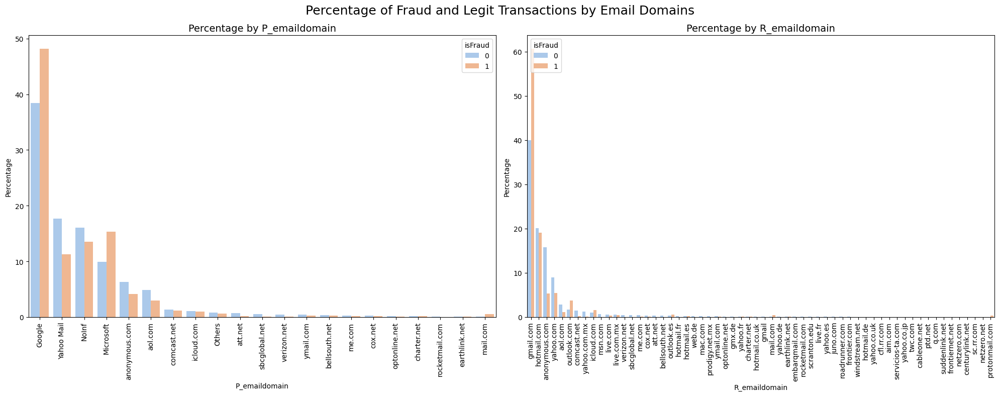

In [ ]:


train_P_email = (
    train[~train['P_emaildomain'].isnull()]
    .groupby(['isFraud'])['P_emaildomain']
    .value_counts(normalize=True)
    .rename('percentage')
    .mul(100)
    .reset_index()
)

train_R_email = (
    train[~train['R_emaildomain'].isnull()]
    .groupby(['isFraud'])['R_emaildomain']
    .value_counts(normalize=True)
    .rename('percentage')
    .mul(100)
    .reset_index()
)

plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.barplot(
    x="P_emaildomain",
    y="percentage",
    hue="isFraud",
    data=train_P_email,
    palette="pastel"
)
plt.xticks(rotation=90)
plt.title('Percentage by P_emaildomain', fontsize=14)
plt.xlabel('P_emaildomain')
plt.ylabel('Percentage')

plt.subplot(1, 2, 2)
sns.barplot(
    x="R_emaildomain",
    y="percentage",
    hue="isFraud",
    data=train_R_email,
    palette="pastel"
)
plt.xticks(rotation=90)
plt.title('Percentage by R_emaildomain', fontsize=14)
plt.xlabel('R_emaildomain')
plt.ylabel('Percentage')

plt.suptitle('Percentage of Fraud and Legit Transactions by Email Domains', fontsize=18)
plt.tight_layout()
plt.show()


In [ ]:
train.loc[train['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'

train.loc[train['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo Mail'
train.loc[train['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
train.loc[train['P_emaildomain'].isin(train['P_emaildomain']\
                                         .value_counts()[train.P_emaildomain.value_counts() <= 500 ]\
                                         .index), 'P_emaildomain'] = "Others"
train['P_emaildomain'].fillna("NoInf", inplace=True)

In [ ]:
train.loc[train['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

train.loc[train['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo Mail'
train.loc[train['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
train.loc[train['R_emaildomain'].isin(train.R_emaildomain\
                                         .value_counts()[train['R_emaildomain'].value_counts() <= 300 ]\
                                         .index), 'R_emaildomain'] = "Others"
train['R_emaildomain'].fillna("NoInf", inplace=True)

## DeviceType

In [ ]:
print(len(train['DeviceType'].value_counts()))
print(len(train['DeviceInfo'].value_counts()))

2
1786


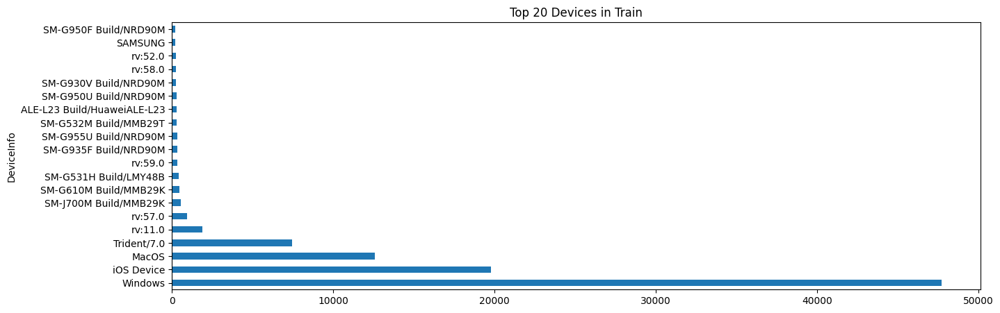

In [ ]:
train['DeviceInfo'].value_counts().head(20).plot(kind='barh', figsize=(15, 5), title='Top 20 Devices in Train')
plt.show()

In [ ]:
train_test['DeviceInfo'] = train_test['DeviceInfo'].fillna('unknown_device').str.lower()
train_test['DeviceName'] = train_test['DeviceInfo'].str.split('/', expand=True)[0]

device_mapping = {
    'SM': 'Samsung',
    'SAMSUNG': 'Samsung',
    'GT-': 'Samsung',
    'Moto G': 'Motorola',
    'Moto': 'Motorola',
    'moto': 'Motorola',
    'LG-': 'LG',
    'rv:': 'RV',
    'HUAWEI': 'Huawei',
    'ALE-': 'Huawei',
    '-L': 'Huawei',
    'Blade': 'ZTE',
    'BLADE': 'ZTE',
    'Linux': 'Linux',
    'XT': 'Sony',
    'HTC': 'HTC',
    'ASUS': 'Asus'
}

for key, value in device_mapping.items():
    train_test.loc[train_test['DeviceName'].str.contains(key, na=False), 'DeviceName'] = value

device_counts = train_test['DeviceName'].value_counts()
rare_devices = device_counts[device_counts < 1000].index
train_test.loc[train_test['DeviceName'].isin(rare_devices), 'DeviceName'] = "Others"


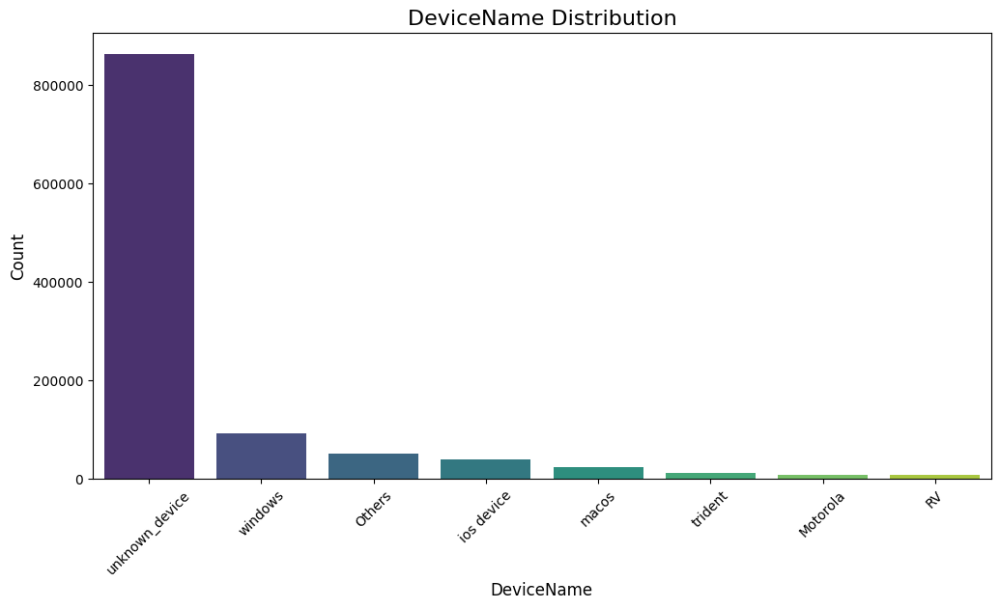

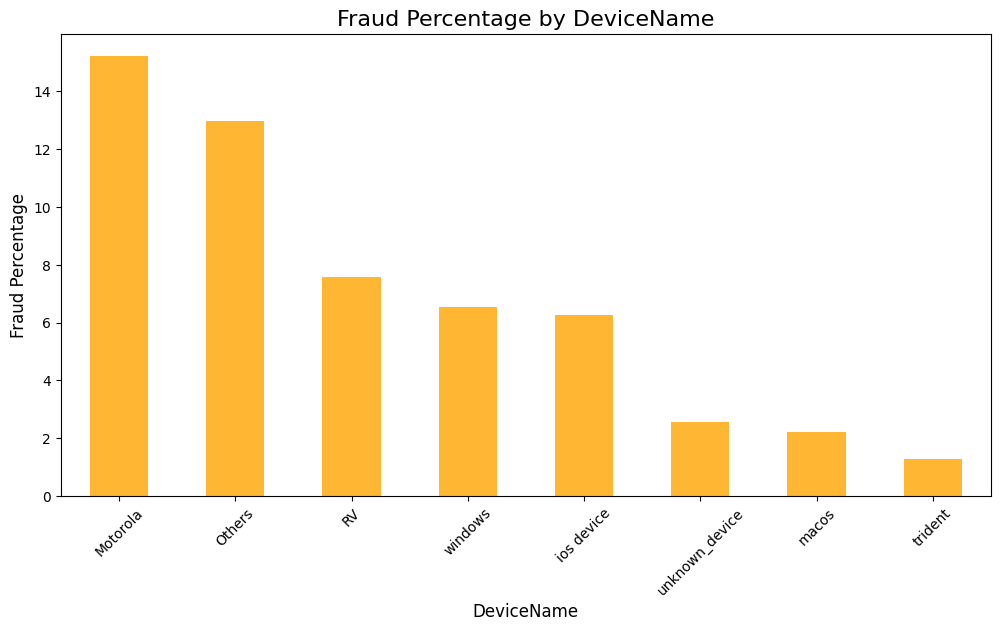

In [ ]:
fraud_percentage = train_test.groupby('DeviceName')['isFraud'].mean() * 100

plt.figure(figsize=(12, 6))
sns.countplot(data=train_test, x='DeviceName', order=train_test['DeviceName'].value_counts().index, palette='viridis')
plt.title("DeviceName Distribution", fontsize=16)
plt.xlabel("DeviceName", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
fraud_percentage.sort_values(ascending=False).plot(kind='bar', color='orange', alpha=0.8)
plt.title("Fraud Percentage by DeviceName", fontsize=16)
plt.xlabel("DeviceName", fontsize=12)
plt.ylabel("Fraud Percentage", fontsize=12)
plt.xticks(rotation=45)
plt.show()

## Card1-card6

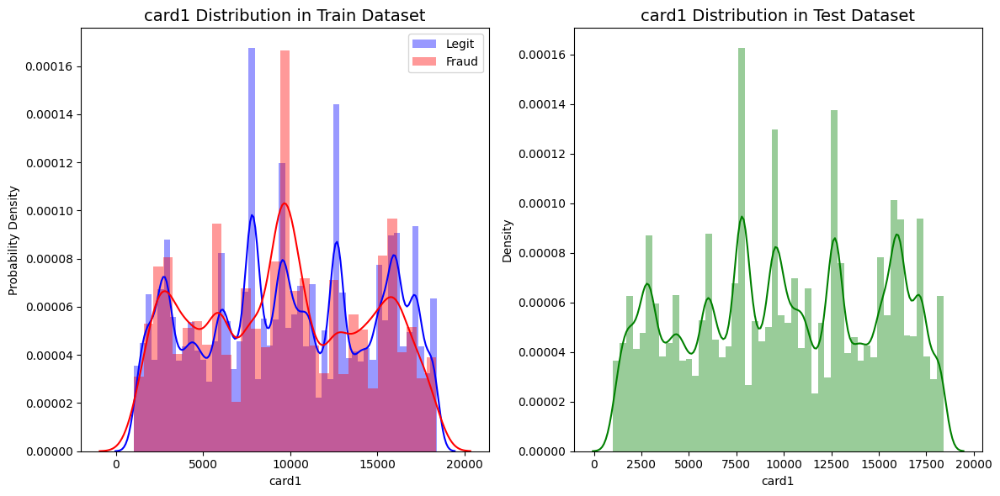

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_card_distribution(train, test):

    card_col = 'card1'

    if card_col not in train.columns or card_col not in test.columns:
        print(f"{card_col} does not exist in train or test dataset.")
        return

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.distplot(train[(train['isFraud'] == 0) & (~train[card_col].isnull())][card_col],
                 label='Legit', kde=True, color='blue')
    sns.distplot(train[(train['isFraud'] == 1) & (~train[card_col].isnull())][card_col],
                 label='Fraud', kde=True, color='red')
    plt.ylabel('Probability Density')
    plt.legend()
    plt.title(f'{card_col} Distribution in Train Dataset', fontsize=14)

    plt.subplot(1, 2, 2)
    sns.distplot(test[~test[card_col].isnull()][card_col], kde=True, color='green')
    plt.title(f'{card_col} Distribution in Test Dataset', fontsize=14)

    plt.tight_layout()
    plt.show()

plot_card_distribution(train, test)


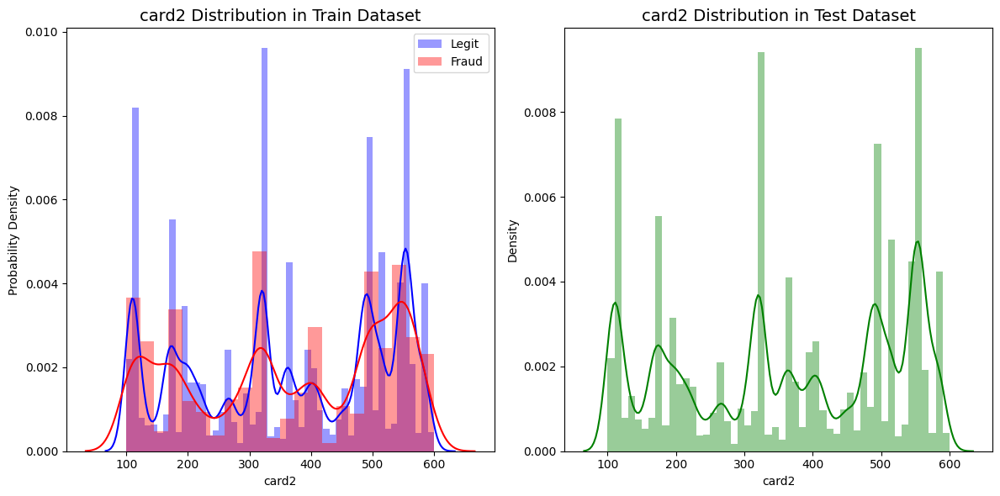

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_card_distribution(train, test):

    card_col = 'card2'

    if card_col not in train.columns or card_col not in test.columns:
        print(f"{card_col} does not exist in train or test dataset.")
        return

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.distplot(train[(train['isFraud'] == 0) & (~train[card_col].isnull())][card_col],
                 label='Legit', kde=True, color='blue')
    sns.distplot(train[(train['isFraud'] == 1) & (~train[card_col].isnull())][card_col],
                 label='Fraud', kde=True, color='red')
    plt.ylabel('Probability Density')
    plt.legend()
    plt.title(f'{card_col} Distribution in Train Dataset', fontsize=14)

    plt.subplot(1, 2, 2)
    sns.distplot(test[~test[card_col].isnull()][card_col], kde=True, color='green')
    plt.title(f'{card_col} Distribution in Test Dataset', fontsize=14)

    plt.tight_layout()
    plt.show()

plot_card_distribution(train, test)

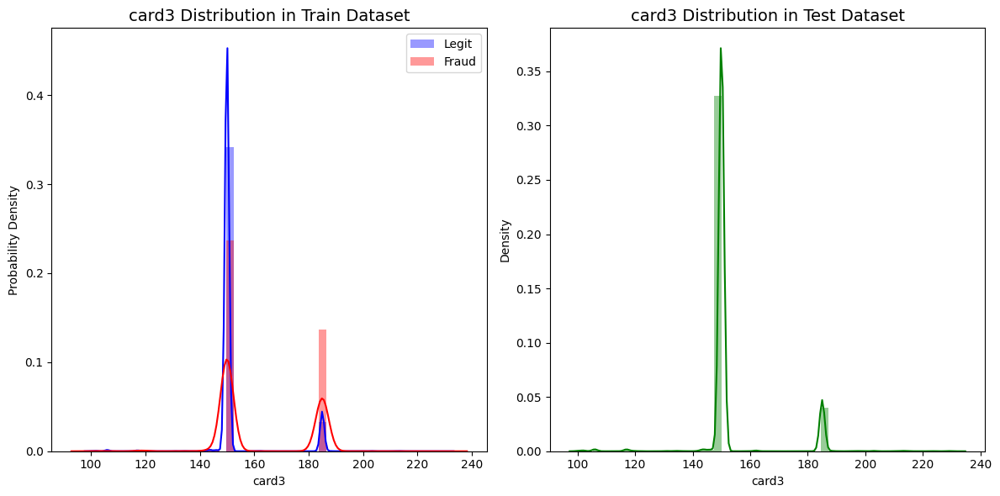

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_card_distribution(train, test):

    card_col = 'card3'

    if card_col not in train.columns or card_col not in test.columns:
        print(f"{card_col} does not exist in train or test dataset.")
        return

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.distplot(train[(train['isFraud'] == 0) & (~train[card_col].isnull())][card_col],
                 label='Legit', kde=True, color='blue')
    sns.distplot(train[(train['isFraud'] == 1) & (~train[card_col].isnull())][card_col],
                 label='Fraud', kde=True, color='red')
    plt.ylabel('Probability Density')
    plt.legend()
    plt.title(f'{card_col} Distribution in Train Dataset', fontsize=14)

    plt.subplot(1, 2, 2)
    sns.distplot(test[~test[card_col].isnull()][card_col], kde=True, color='green')
    plt.title(f'{card_col} Distribution in Test Dataset', fontsize=14)

    plt.tight_layout()
    plt.show()

plot_card_distribution(train, test)

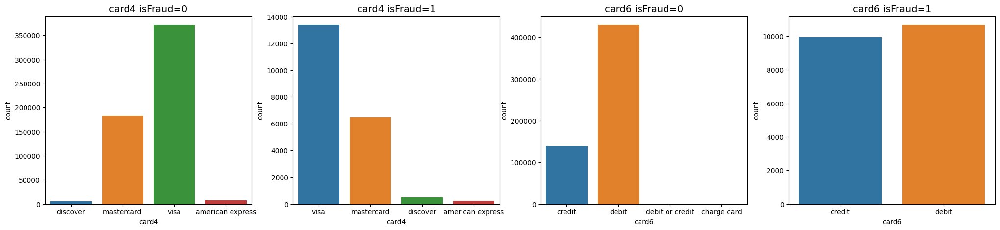

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(25,5))

sns.countplot(x="card4", ax=ax[0], data=train.loc[train['isFraud'] == 0])
ax[0].set_title('card4 isFraud=0', fontsize=14)
sns.countplot(x="card4", ax=ax[1], data=train.loc[train['isFraud'] == 1])
ax[1].set_title('card4 isFraud=1', fontsize=14)
sns.countplot(x="card6", ax=ax[2], data=train.loc[train['isFraud'] == 0])
ax[2].set_title('card6 isFraud=0', fontsize=14)
sns.countplot(x="card6", ax=ax[3], data=train.loc[train['isFraud'] == 1])
ax[3].set_title('card6 isFraud=1', fontsize=14)
plt.show()

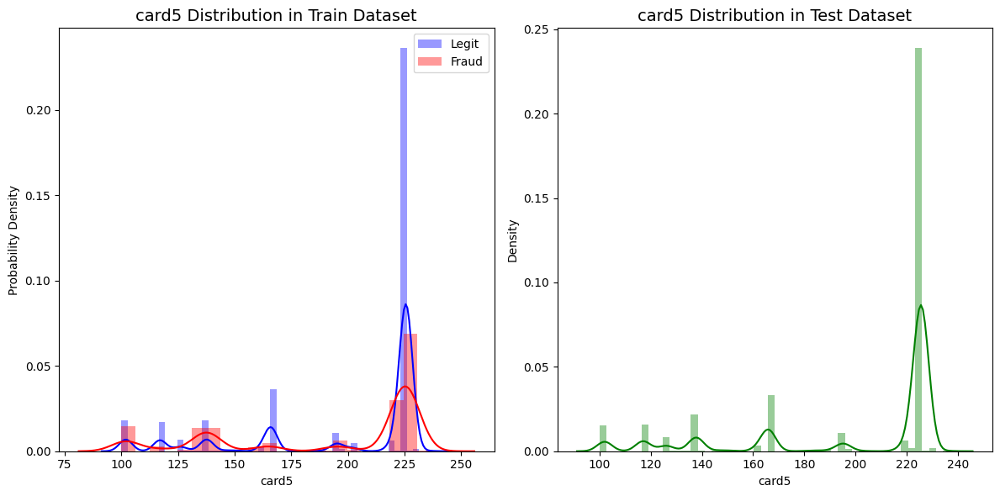

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_card_distribution(train, test):

    card_col = 'card5'

    if card_col not in train.columns or card_col not in test.columns:
        print(f"{card_col} does not exist in train or test dataset.")
        return

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.distplot(train[(train['isFraud'] == 0) & (~train[card_col].isnull())][card_col],
                 label='Legit', kde=True, color='blue')
    sns.distplot(train[(train['isFraud'] == 1) & (~train[card_col].isnull())][card_col],
                 label='Fraud', kde=True, color='red')
    plt.ylabel('Probability Density')
    plt.legend()
    plt.title(f'{card_col} Distribution in Train Dataset', fontsize=14)

    plt.subplot(1, 2, 2)
    sns.distplot(test[~test[card_col].isnull()][card_col], kde=True, color='green')
    plt.title(f'{card_col} Distribution in Test Dataset', fontsize=14)

    plt.tight_layout()
    plt.show()

plot_card_distribution(train, test)

## C1-C14


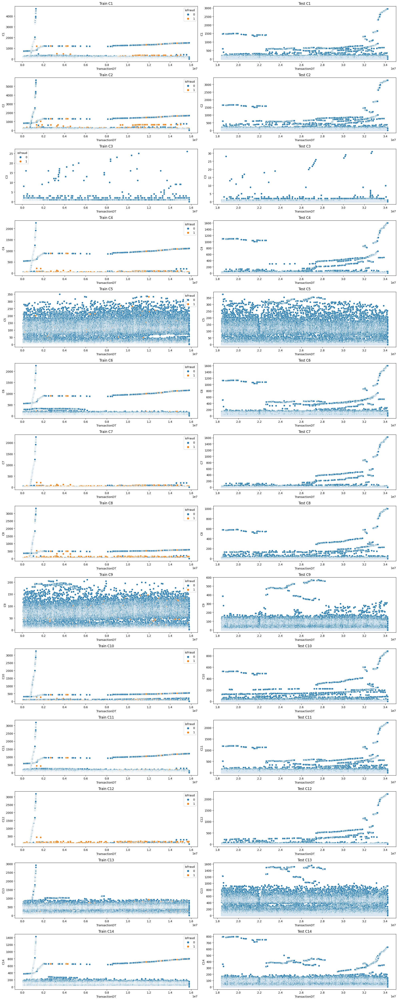

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

continuous_vars = [f'C{i}' for i in range(1, 15)]

plt.figure(figsize=(20, 50))

for idx, col in enumerate(continuous_vars):
    plt.subplot(len(continuous_vars), 2, 2 * idx + 1)
    sns.scatterplot(x="TransactionDT", y=col, hue="isFraud", data=train[~train[col].isnull()])
    plt.title(f'Train {col}')
    plt.xlabel('TransactionDT')
    plt.ylabel(col)

    plt.subplot(len(continuous_vars), 2, 2 * idx + 2)
    sns.scatterplot(x="TransactionDT", y=col, data=test[~test[col].isnull()])
    plt.title(f'Test {col}')
    plt.xlabel('TransactionDT')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

## D1-D15

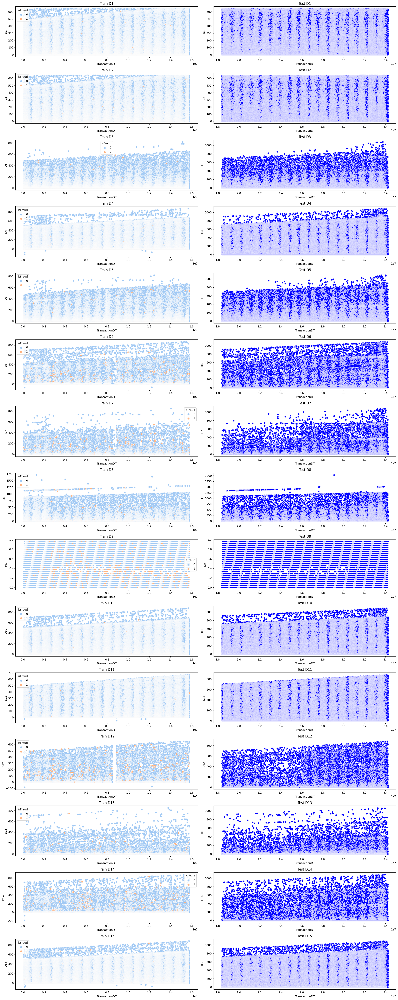

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_d_features(train, test, start=1, end=16):

    d_features = [f"D{i}" for i in range(start, end)]  # Generate 'D' column names

    plt.figure(figsize=(20, 50))

    plot_index = 1
    for feature in d_features:
        plt.subplot(len(d_features), 2, plot_index)
        sns.scatterplot(
            x="TransactionDT", y=feature, hue="isFraud", data=train[~train[feature].isnull()], palette="pastel"
        )
        plt.title(f'Train {feature}')
        plt.xlabel('TransactionDT')
        plt.ylabel(feature)
        plot_index += 1

        plt.subplot(len(d_features), 2, plot_index)
        sns.scatterplot(x="TransactionDT", y=feature, data=test[~test[feature].isnull()], color="blue")
        plt.title(f'Test {feature}')
        plt.xlabel('TransactionDT')
        plt.ylabel(feature)
        plot_index += 1

    plt.tight_layout()
    plt.show()

plot_d_features(train, test)


## M1-M9

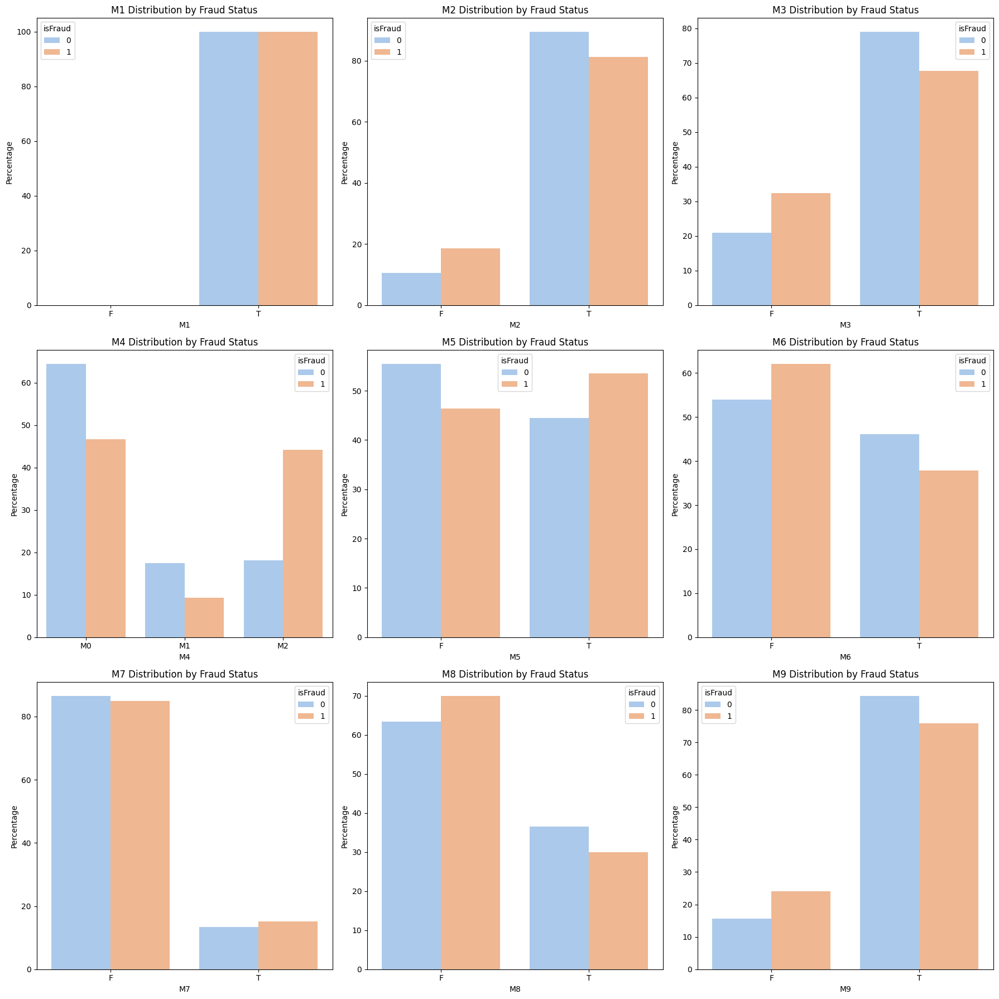

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting M1-M9 distributions
def plot_m_features(train, start=1, end=10):

    plt.figure(figsize=(18, 18))

    # Loop through M features
    for idx in range(start, end):
        feature = f'M{idx}'
        data = (
            train.groupby(['isFraud'])[feature]
            .value_counts(normalize=True)
            .rename('percentage')
            .mul(100)
            .reset_index()
            .sort_values(feature)
        )

        plt.subplot(3, 3, idx - start + 1)
        sns.barplot(x=feature, y="percentage", hue="isFraud", data=data, palette="pastel")
        plt.title(f'{feature} Distribution by Fraud Status')
        plt.xlabel(feature)
        plt.ylabel('Percentage')

    plt.tight_layout()
    plt.show()

# Example Usage
plot_m_features(train)

### V features(v1-v339)

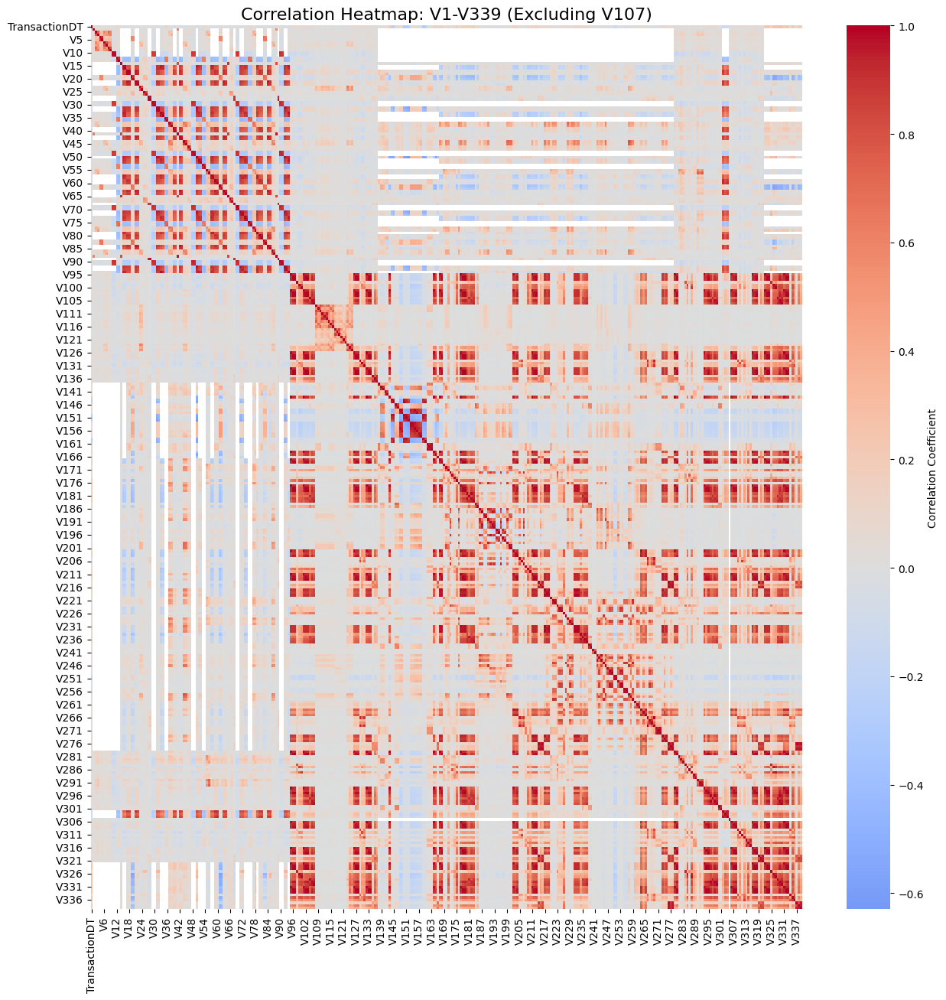

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

cols = ['TransactionDT'] + [f'V{x}' for x in range(1, 340)]
cols.remove('V107')

train_sampled = train[cols].sample(frac=0.2, random_state=42)

plt.figure(figsize=(15, 15))
sns.heatmap(
    train_sampled.corr(),
    cmap='coolwarm',
    annot=False,
    center=0.0,
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title('Correlation Heatmap: V1-V339 (Excluding V107)', fontsize=16)
plt.show()

In [ ]:
id_cols = [c for c in train_test if c[:2] == 'id']

id_num_cols=id_cols[:11]
id_cat_cols=id_cols[11:]

In [ ]:
id_columns = [
    'id_03', 'id_04', 'id_12', 'id_14', 'id_15', 'id_16', 'id_18', 'id_23',
    'id_24', 'id_27', 'id_28', 'id_29', 'id_32', 'id_34', 'id_35', 'id_36',
    'id_37', 'id_38'
]

for col in id_columns:
    print(f"Column: {col}")
    print(f"  Unique Values: {train[col].nunique()}")
    print(f"  Missing Values: {train[col].isnull().sum()}")
    print(f"  Data Type: {train[col].dtype}")
    print(f"  Value Counts (Top 5):\n{train[col].value_counts().head()}")
    print("-" * 50)


Column: id_03
  Unique Values: 24
  Missing Values: 524216
  Data Type: float16
  Value Counts (Top 5):
id_03
0.000    63903
1.000      863
3.000      668
2.000      421
5.000      109
Name: count, dtype: int64
--------------------------------------------------
Column: id_04
  Unique Values: 15
  Missing Values: 524216
  Data Type: float16
  Value Counts (Top 5):
id_04
0.000     65739
-5.000      132
-6.000       98
-8.000       64
-4.000       51
Name: count, dtype: int64
--------------------------------------------------
Column: id_12
  Unique Values: 2
  Missing Values: 446307
  Data Type: object
  Value Counts (Top 5):
id_12
NotFound    123025
Found        21208
Name: count, dtype: int64
--------------------------------------------------
Column: id_14
  Unique Values: 25
  Missing Values: 510496
  Data Type: float16
  Value Counts (Top 5):
id_14
-300.000    44121
-360.000    16661
-480.000    12891
-420.000     4542
-600.000      498
Name: count, dtype: int64
----------------------

# Modelling
##  Loading Data

In [ ]:
print('LOADING DATA')
train_transaction = pd.read_csv("/kaggle/input/ieee-fraud-detection/train_transaction.csv")
train_identity = pd.read_csv("/kaggle/input/ieee-fraud-detection/train_identity.csv")

test_transaction = pd.read_csv("/kaggle/input/ieee-fraud-detection/test_transaction.csv")
test_identity = pd.read_csv("/kaggle/input/ieee-fraud-detection/test_identity.csv")

# Fix column names
fix_col_name = {testIdCol: trainIdCol for testIdCol, trainIdCol in zip(test_identity.columns, train_identity.columns)}
test_identity.rename(columns=fix_col_name, inplace=True)

# Reduce memory usage
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
for df in [train_transaction, train_identity, test_transaction, test_identity]:
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024**2
    print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))

# Merge transaction and identity
train = train_transaction.merge(train_identity, on='TransactionID', how='left')
test = test_transaction.merge(test_identity, on='TransactionID', how='left')

# Combine train and test datasets
train_test = pd.concat([train, test], ignore_index=True)

print(f'Train dataset has {train.shape[0]} rows and {train.shape[1]} columns.')
print(f'Test dataset has {test.shape[0]} rows and {test.shape[1]} columns.')

del train_transaction, train_identity, test_transaction, test_identity
import gc
gc.collect()


LOADING DATA
Mem. usage decreased to 542.35 Mb (69.4% reduction)
Mem. usage decreased to 25.86 Mb (42.7% reduction)
Mem. usage decreased to 472.59 Mb (68.9% reduction)
Mem. usage decreased to 25.44 Mb (42.7% reduction)
Train dataset has 590540 rows and 434 columns.
Test dataset has 506691 rows and 433 columns.


0

## PROCESSING DATA

In [ ]:
import datetime
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.decomposition import PCA
import gc

print("PROCESSING DATA")

# Initialize list of columns to drop
drop_col_list = []

# TransactionDT Processing
print("Processing TransactionDT...")
START_DATE = '2017-12-01'
startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
train_test['NewDate'] = train_test['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))
train_test['NewDate_YMD'] = train_test['NewDate'].dt.year.astype(str) + '-' + train_test['NewDate'].dt.month.astype(str) + '-' + train_test['NewDate'].dt.day.astype(str)
train_test['NewDate_YearMonth'] = train_test['NewDate'].dt.year.astype(str) + '-' + train_test['NewDate'].dt.month.astype(str)
train_test['NewDate_Weekday'] = train_test['NewDate'].dt.dayofweek
train_test['NewDate_Hour'] = train_test['NewDate'].dt.hour
train_test['NewDate_Day'] = train_test['NewDate'].dt.day
drop_col_list.extend(["TransactionDT", "NewDate"])

print("Processing TransactionAmt...")
train_test['TransactionAmt'] = train_test['TransactionAmt'].astype('float32')  # Ensure compatible type
train_test['New_Cents'] = (train_test['TransactionAmt'] - np.floor(train_test['TransactionAmt'])).astype('float32')
train_test['New_TransactionAmt_Bin'] = pd.qcut(train_test['TransactionAmt'].astype('float64'), 15)
# Card Feature Processing
print("Processing card features...")
card_cols = [c for c in train_test if c.startswith('ca')]
for col in ['card2', 'card3', 'card4', 'card5', 'card6']:
    train_test[col] = train_test.groupby(['card1'])[col].transform(lambda x: x.mode(dropna=False).iat[0])
    train_test[col].fillna(train_test[col].mode()[0], inplace=True)

# Email Domain Processing
print("Processing email domains...")
train_test.loc[train_test['P_emaildomain'].isin(['gmail.com', 'gmail']), 'P_emaildomain'] = 'Google'
train_test.loc[train_test['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx', 'yahoo.co.uk', 'yahoo.co.jp', 'yahoo.de', 'yahoo.fr', 'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
train_test.loc[train_test['P_emaildomain'].isin(['hotmail.com', 'outlook.com', 'msn.com', 'live.com.mx', 'hotmail.es', 'hotmail.co.uk', 'hotmail.de', 'outlook.es', 'live.com', 'live.fr', 'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
train_test.loc[train_test['P_emaildomain'].isin(train_test['P_emaildomain'].value_counts()[train_test['P_emaildomain'].value_counts() <= 500].index), 'P_emaildomain'] = "Others"
train_test['P_emaildomain'].fillna("Unknown", inplace=True)

train_test.loc[train_test['R_emaildomain'].isin(['gmail.com', 'gmail']), 'R_emaildomain'] = 'Google'
train_test.loc[train_test['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx', 'yahoo.co.uk', 'yahoo.co.jp', 'yahoo.de', 'yahoo.fr', 'yahoo.es']), 'R_emaildomain'] = 'Yahoo'
train_test.loc[train_test['R_emaildomain'].isin(['hotmail.com', 'outlook.com', 'msn.com', 'live.com.mx', 'hotmail.es', 'hotmail.co.uk', 'hotmail.de', 'outlook.es', 'live.com', 'live.fr', 'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
train_test.loc[train_test['R_emaildomain'].isin(train_test['R_emaildomain'].value_counts()[train_test['R_emaildomain'].value_counts() <= 300].index), 'R_emaildomain'] = "Others"
train_test['R_emaildomain'].fillna("Unknown", inplace=True)

# DeviceInfo Processing
print("Processing DeviceInfo...")
train_test['DeviceInfo'] = train_test['DeviceInfo'].fillna('unknown_device').str.lower()
train_test['DeviceInfo'] = train_test['DeviceInfo'].str.split('/', expand=True)[0]
device_mapping = {
    'Samsung': ['SM', 'SAMSUNG', 'GT-'],
    'Motorola': ['Moto G', 'Moto', 'moto'],
    'LG': ['LG-'],
    'RV': ['rv:'],
    'Huawei': ['HUAWEI', 'ALE-', '-L'],
    'ZTE': ['Blade', 'BLADE'],
    'Linux': ['Linux'],
    'Sony': ['XT'],
    'HTC': ['HTC'],
    'Asus': ['ASUS']
}

for brand, keywords in device_mapping.items():
    for keyword in keywords:
        train_test.loc[train_test['DeviceInfo'].str.contains(keyword, na=False), 'DeviceInfo'] = brand

train_test.loc[train_test['DeviceInfo'].isin(train_test['DeviceInfo'].value_counts()[train_test['DeviceInfo'].value_counts() < 1000].index), 'DeviceInfo'] = "Others"

# V1-V339 Feature Processing
print("Processing V1-V339 features...")
v_cols = [c for c in train_test if c.startswith('V')]
v_nan_df = train_test[v_cols].isna()
nan_groups = {}

for col in v_cols:
    cur_group = v_nan_df[col].sum()
    try:
        nan_groups[cur_group].append(col)
    except:
        nan_groups[cur_group] = [col]
del v_nan_df
gc.collect()

for nan_cnt, v_group in nan_groups.items():
    train_test['New_v_group_' + str(nan_cnt) + '_nulls'] = nan_cnt
    scaler = MinMaxScaler()
    pca = PCA(n_components=2)
    v_group_pca = pca.fit_transform(scaler.fit_transform(train_test[v_group].fillna(-1)))
    train_test['New_v_group_' + str(nan_cnt) + '_pca0'] = v_group_pca[:, 0]
    train_test['New_v_group_' + str(nan_cnt) + '_pca1'] = v_group_pca[:, 1]

drop_col_list.extend(v_cols)

# Creating New Features
print("Creating new features...")
train_test['New_card1_card2'] = train_test['card1'].astype(str) + '_' + train_test['card2'].astype(str)
train_test['New_addr1_addr2'] = train_test['addr1'].astype(str) + '_' + train_test['addr2'].astype(str)
train_test['New_card1_card2_addr1_addr2'] = train_test['New_card1_card2'] + '_' + train_test['New_addr1_addr2']


PROCESSING DATA
Processing TransactionDT...
Processing TransactionAmt...
Processing card features...
Processing email domains...
Processing DeviceInfo...
Processing V1-V339 features...
Creating new features...


In [ ]:
print("Handling categorical and numerical data for aggregation...")

# Ensure data types for numerical columns are compatible
numerical_columns = ['TransactionAmt', 'id_02', 'D15']
for col in numerical_columns:
    train_test[col] = train_test[col].astype('float64')

# Handle missing values in grouping columns
# Identify purely numeric columns for grouping
numeric_grouping_columns = ['card1', 'addr1']
for col in numeric_grouping_columns:
    train_test[col] = train_test[col].fillna(-1).astype('int64')

# Handle non-numeric grouping columns (categorical)
categorical_grouping_columns = ['card4']
for col in categorical_grouping_columns:
    train_test[col] = train_test[col].fillna('Unknown')
    le = LabelEncoder()
    train_test[col] = le.fit_transform(train_test[col].astype(str))

# Create aggregation features for TransactionAmt
print("Creating aggregation features for TransactionAmt...")
train_test['New_TransactionAmt_to_mean_card1'] = (
    train_test['TransactionAmt'] / train_test.groupby(['card1'])['TransactionAmt'].transform('mean')
)
train_test['New_TransactionAmt_to_mean_card4'] = (
    train_test['TransactionAmt'] / train_test.groupby(['card4'])['TransactionAmt'].transform('mean')
)
train_test['New_TransactionAmt_to_std_card1'] = (
    train_test['TransactionAmt'] / train_test.groupby(['card1'])['TransactionAmt'].transform('std')
)
train_test['TransactionAmt_to_std_card4'] = (
    train_test['TransactionAmt'] / train_test.groupby(['card4'])['TransactionAmt'].transform('std')
)

# Create aggregation features for id_02
print("Creating aggregation features for id_02...")
train_test['New_id_02_to_mean_card1'] = (
    train_test['id_02'] / train_test.groupby(['card1'])['id_02'].transform('mean')
)
train_test['New_id_02_to_mean_card4'] = (
    train_test['id_02'] / train_test.groupby(['card4'])['id_02'].transform('mean')
)
train_test['New_id_02_to_std_card1'] = (
    train_test['id_02'] / train_test.groupby(['card1'])['id_02'].transform('std')
)
train_test['New_id_02_to_std_card4'] = (
    train_test['id_02'] / train_test.groupby(['card4'])['id_02'].transform('std')
)

# Create aggregation features for D15
print("Creating aggregation features for D15...")
train_test['New_D15_to_mean_card1'] = (
    train_test['D15'] / train_test.groupby(['card1'])['D15'].transform('mean')
)
train_test['New_D15_to_mean_card4'] = (
    train_test['D15'] / train_test.groupby(['card4'])['D15'].transform('mean')
)
train_test['New_D15_to_std_card1'] = (
    train_test['D15'] / train_test.groupby(['card1'])['D15'].transform('std')
)
train_test['New_D15_to_std_card4'] = (
    train_test['D15'] / train_test.groupby(['card4'])['D15'].transform('std')
)

# Create aggregation features for D15 and addr1
print("Creating aggregation features for D15 and addr1...")
train_test['New_D15_to_mean_addr1'] = (
    train_test['D15'] / train_test.groupby(['addr1'])['D15'].transform('mean')
)
train_test['New_D15_to_mean_card4'] = (
    train_test['D15'] / train_test.groupby(['card4'])['D15'].transform('mean')
)
train_test['New_D15_to_std_addr1'] = (
    train_test['D15'] / train_test.groupby(['addr1'])['D15'].transform('std')
)
train_test['New_D15_to_std_card4'] = (
    train_test['D15'] / train_test.groupby(['card4'])['D15'].transform('std')
)

# Extend drop column list
drop_col_list.extend(numeric_grouping_columns + categorical_grouping_columns)


Handling categorical and numerical data for aggregation...
Creating aggregation features for TransactionAmt...
Creating aggregation features for id_02...
Creating aggregation features for D15...
Creating aggregation features for D15 and addr1...


In [ ]:
# Frequency Encoding
print("Applying frequency encoding...")
freq_cols = ["New_TransactionAmt_Bin", 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'DeviceType', 'DeviceInfo']
for col in freq_cols:
    freq_map = train_test[col].value_counts(normalize=True).to_dict()
    train_test[f'FE_{col}'] = train_test[col].map(freq_map).astype('float32')


Applying frequency encoding...


In [ ]:

# Dropping Unnecessary Features
print("Dropping unnecessary features...")
train_test.drop(columns=drop_col_list, inplace=True)


Dropping unnecessary features...


In [ ]:

# Label Encoding
print("Applying label encoding...")
for col in train_test.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    train_test[col] = le.fit_transform(train_test[col].astype(str))



Applying label encoding...


In [ ]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, classification_report

target = 'isFraud'

features = [f for f in train.columns if f not in [target, 'TransactionID', 'New_TransactionAmt_Bin', 'NewDate']]

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, classification_report

# Replace inf/-inf and fill NaN with 0
print("Handling missing values...")
train[features] = train[features].replace([np.inf, -np.inf], np.nan).fillna(0)
test[features] = test[features].replace([np.inf, -np.inf], np.nan).fillna(0)
X = train[features]
y = train[target]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


Handling missing values...


In [ ]:
# Check for non-numeric columns
non_numeric_cols = X_train.select_dtypes(include=['object', 'category']).columns
print(f"Non-numeric columns: {non_numeric_cols}")

# Convert non-numeric columns to numeric (if applicable)
for col in non_numeric_cols:
    X_train[col], _ = X_train[col].factorize()  # Converts categorical strings to integers
    X_test[col] = X_test[col].map(dict(zip(_, range(len(_)))))  # Apply the same mapping
    X_test[col].fillna(-1, inplace=True)  # Handle any missing values


Non-numeric columns: Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15',
       'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33',
       'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
       'DeviceInfo'],
      dtype='object')


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Apply Label Encoding to non-numeric columns
for col in non_numeric_cols:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col].astype(str))

    # Handle unseen labels in the test set
    X_test[col] = X_test[col].astype(str).apply(lambda x: x if x in le.classes_ else 'unknown')
    le.classes_ = np.append(le.classes_, 'unknown')  # Add 'unknown' to the classes
    X_test[col] = le.transform(X_test[col])


## LGBMClassifier


Training Fold 1...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[999]	valid_0's auc: 0.969433
  Fold 1 Precision: 0.955288
  Fold 1 Recall: 0.598684
  Fold 1 F1-Score: 0.736070
  Fold 1 AUC: 0.969433


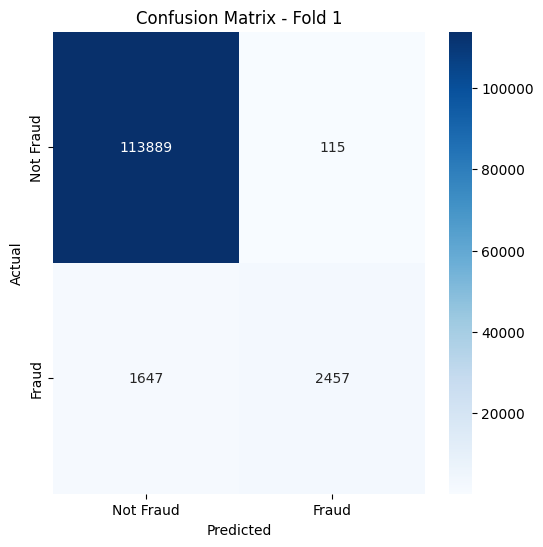

Training Fold 2...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.967119
  Fold 2 Precision: 0.944817
  Fold 2 Recall: 0.592877
  Fold 2 F1-Score: 0.728571
  Fold 2 AUC: 0.967119


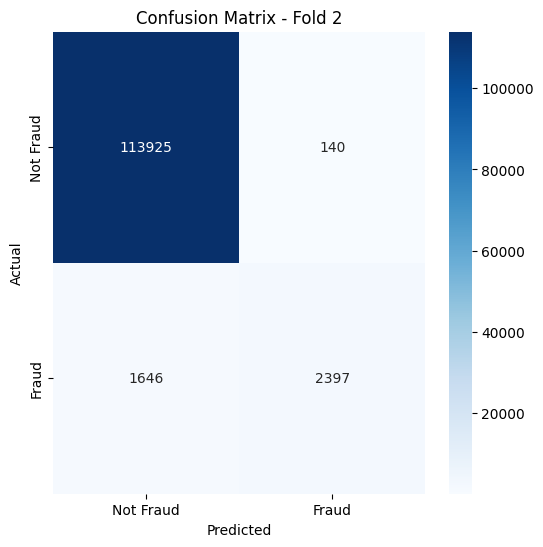

Training Fold 3...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.967322
  Fold 3 Precision: 0.949695
  Fold 3 Recall: 0.587736
  Fold 3 F1-Score: 0.726107
  Fold 3 AUC: 0.967322


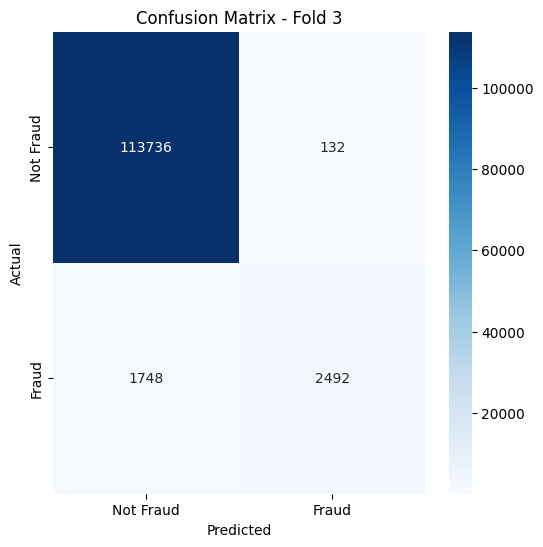

Training Fold 4...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.967151
  Fold 4 Precision: 0.945462
  Fold 4 Recall: 0.586799
  Fold 4 F1-Score: 0.724153
  Fold 4 AUC: 0.967151


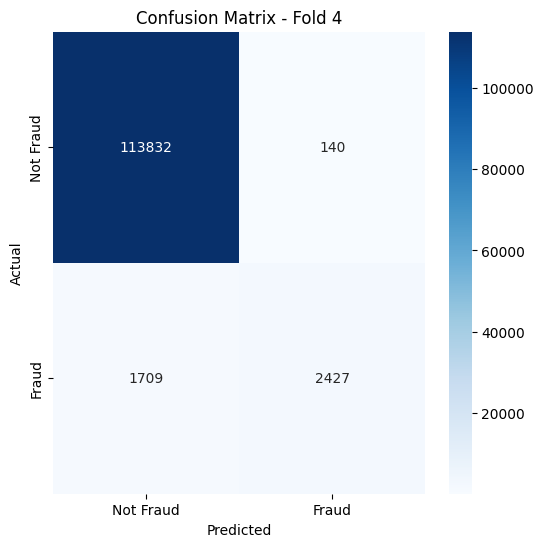

Training Fold 5...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.970066
  Fold 5 Precision: 0.952692
  Fold 5 Recall: 0.598309
  Fold 5 F1-Score: 0.735015
  Fold 5 AUC: 0.970066


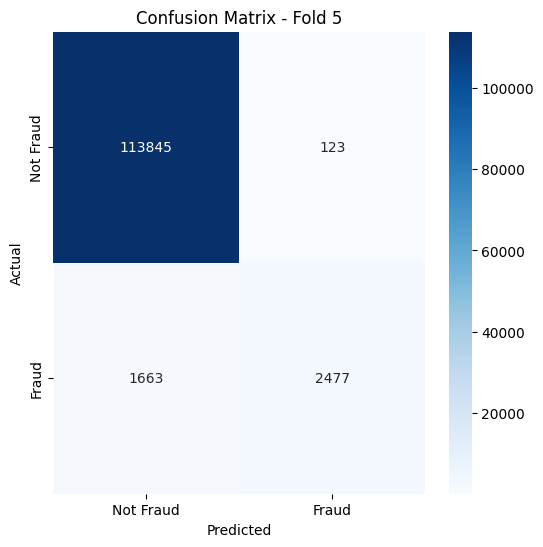


Overall Metrics:
Precision: 0.949591
Recall: 0.592881
F1-Score: 0.729983
AUC: 0.968218


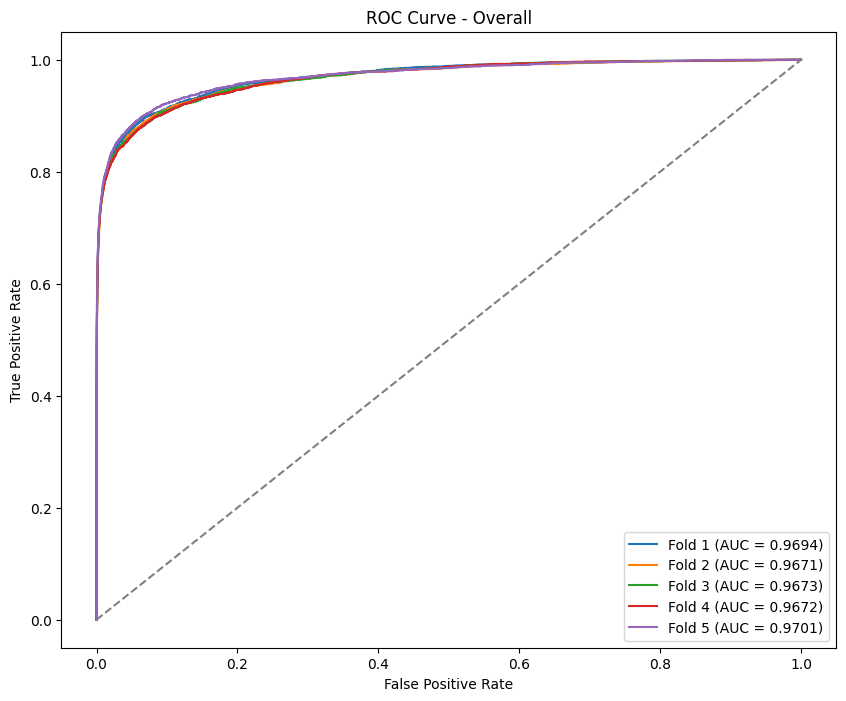

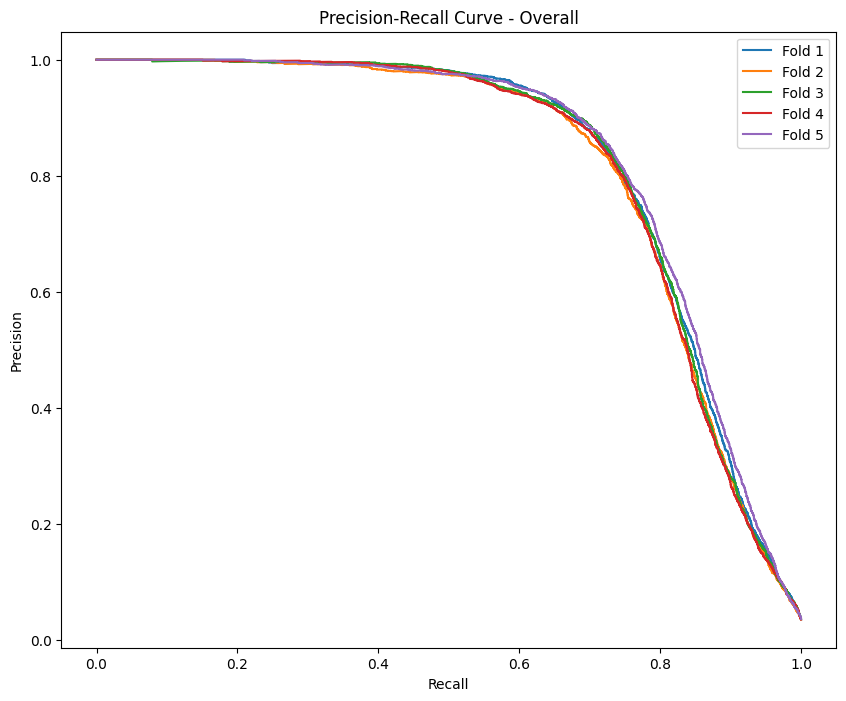

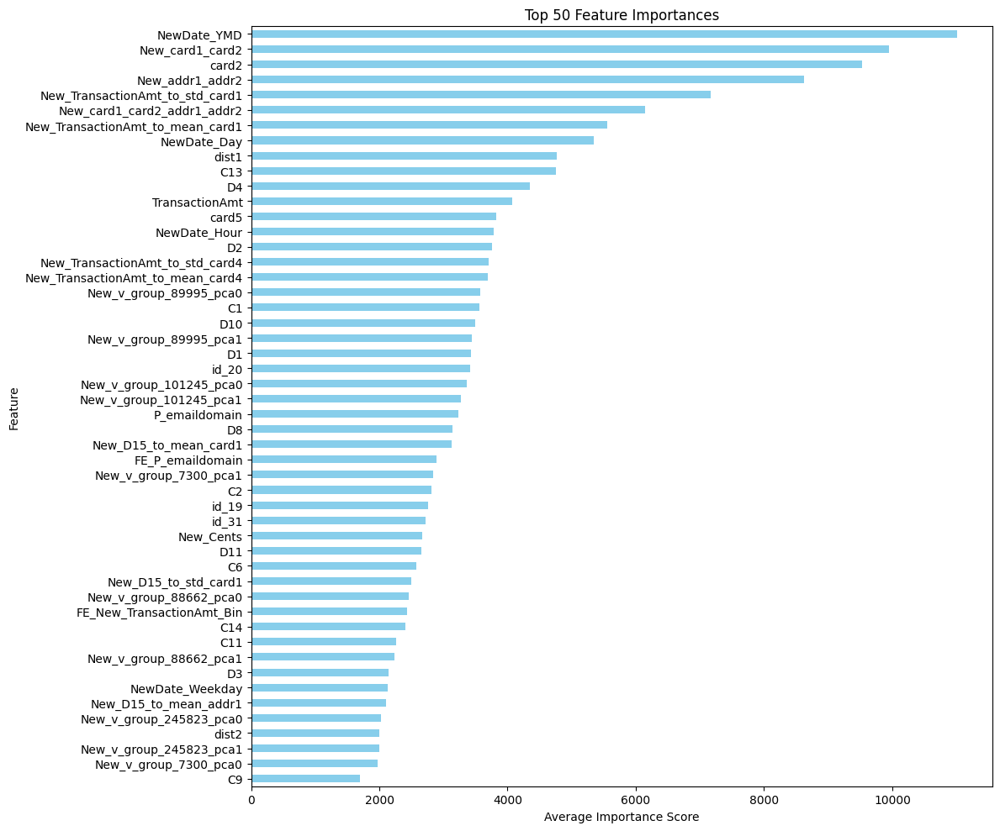


Top 50 features saved to 'top_50_features.csv'.


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve
from lightgbm import early_stopping

# Initialize lists to store metrics
precision_lgb_list = []
recall_lgb_list = []
f1_lgb_list = []
auc_lgb_list = []

# Placeholder to accumulate feature importance across folds
feature_importance_df = pd.DataFrame()

clf_lgb = LGBMClassifier(**params)
for fold, (train_idx, valid_idx) in enumerate(folds.split(train[features], train[target])):
    print(f"Training Fold {fold + 1}...")

    X_train, y_train = train[features].iloc[train_idx], train[target].iloc[train_idx]
    X_valid, y_valid = train[features].iloc[valid_idx], train[target].iloc[valid_idx]

    clf_lgb.fit(
        X_train, y_train,
        eval_set=[(X_valid, y_valid)],
        eval_metric='auc',
        callbacks=[early_stopping(stopping_rounds=100)],
    )

    # Predict probabilities and binary labels
    valid_probs = clf_lgb.predict_proba(X_valid)[:, 1]
    valid_preds = (valid_probs > 0.5).astype(int)

    # Store out-of-fold predictions
    oof_preds_lgb[valid_idx] = valid_probs
    sub_preds_lgb += clf_lgb.predict_proba(test[features])[:, 1] / folds.n_splits

    # Calculate metrics for the current fold
    precision = precision_score(y_valid, valid_preds)
    recall = recall_score(y_valid, valid_preds)
    f1 = f1_score(y_valid, valid_preds)
    fpr, tpr, _ = roc_curve(y_valid, valid_probs)
    roc_auc = auc(fpr, tpr)

    precision_lgb_list.append(precision)
    recall_lgb_list.append(recall)
    f1_lgb_list.append(f1)
    auc_lgb_list.append(roc_auc)

    print(f"  Fold {fold + 1} Precision: {precision:.6f}")
    print(f"  Fold {fold + 1} Recall: {recall:.6f}")
    print(f"  Fold {fold + 1} F1-Score: {f1:.6f}")
    print(f"  Fold {fold + 1} AUC: {roc_auc:.6f}")

    # Confusion matrix
    cm = confusion_matrix(y_valid, valid_preds)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
    plt.title(f'Confusion Matrix - Fold {fold + 1}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Accumulate feature importance for this fold
    fold_importance = pd.DataFrame()
    fold_importance["feature"] = features
    fold_importance["importance"] = clf_lgb.feature_importances_
    fold_importance["fold"] = fold + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance], axis=0)

# Calculate overall metrics
overall_precision = np.mean(precision_lgb_list)
overall_recall = np.mean(recall_lgb_list)
overall_f1 = np.mean(f1_lgb_list)
overall_auc = np.mean(auc_lgb_list)

# Display overall metrics
print(f"\nOverall Metrics:")
print(f"Precision: {overall_precision:.6f}")
print(f"Recall: {overall_recall:.6f}")
print(f"F1-Score: {overall_f1:.6f}")
print(f"AUC: {overall_auc:.6f}")

# Overall ROC Curve
plt.figure(figsize=(10, 8))
for i, (fpr, tpr, roc_auc) in enumerate(roc_data):
    plt.plot(fpr, tpr, label=f'Fold {i + 1} (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title('ROC Curve - Overall')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

# Overall Precision-Recall Curve
plt.figure(figsize=(10, 8))
for i, (precision_vals, recall_vals) in enumerate(prc_data):
    plt.plot(recall_vals, precision_vals, label=f'Fold {i + 1}')
plt.title('Precision-Recall Curve - Overall')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()

# Average feature importance over all folds
avg_feature_importance = feature_importance_df.groupby("feature")["importance"].mean().sort_values(ascending=False)

# Get the top 50 features
top_50_features = avg_feature_importance.head(50)

# Plot the top 50 features
plt.figure(figsize=(12, 10))
top_50_features.sort_values().plot(kind="barh", color="skyblue")
plt.title("Top 50 Feature Importances")
plt.xlabel("Average Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Save the top 50 features to a CSV file
top_50_features.to_csv("top_50_features.csv", header=True)
print("\nTop 50 features saved to 'top_50_features.csv'.")


## XGBClassifier

Training Fold 1...
  Fold 1 Precision: 0.956388
  Fold 1 Recall: 0.590690
  Fold 1 F1-Score: 0.730317
  Fold 1 AUC: 0.966635


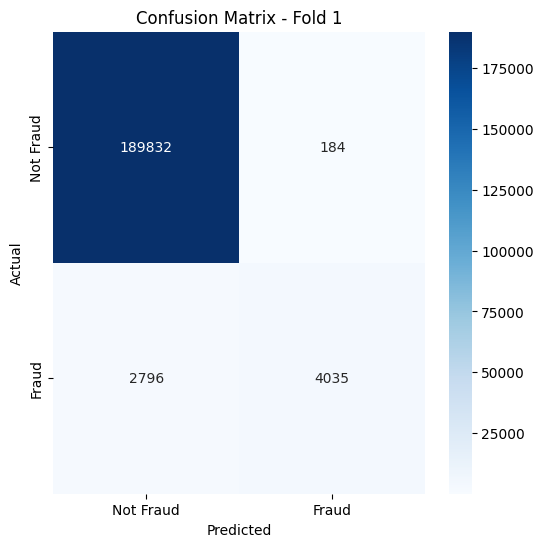

Training Fold 2...
  Fold 2 Precision: 0.948505
  Fold 2 Recall: 0.574117
  Fold 2 F1-Score: 0.715283
  Fold 2 AUC: 0.962638


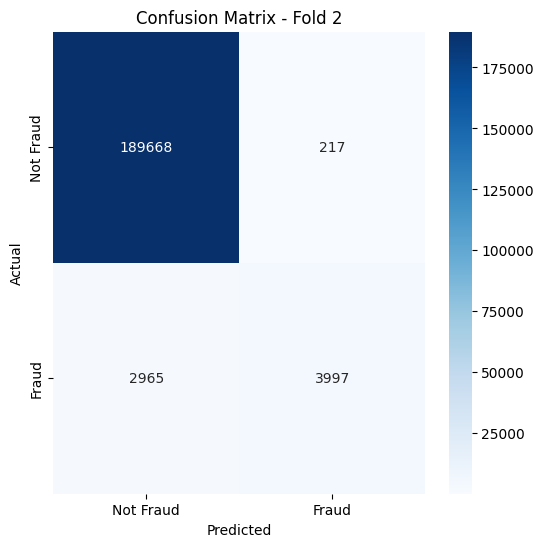

Training Fold 3...
  Fold 3 Precision: 0.949786
  Fold 3 Recall: 0.580932
  Fold 3 F1-Score: 0.720918
  Fold 3 AUC: 0.964078


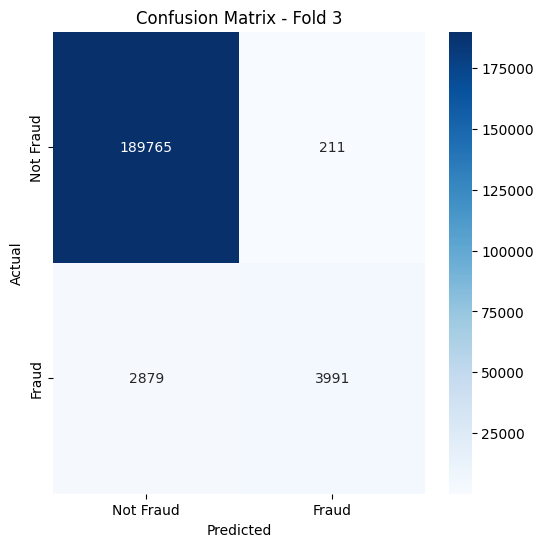


XGBoost Overall Metrics:
Precision: 0.951560
Recall: 0.581913
F1-Score: 0.722172
AUC: 0.964450


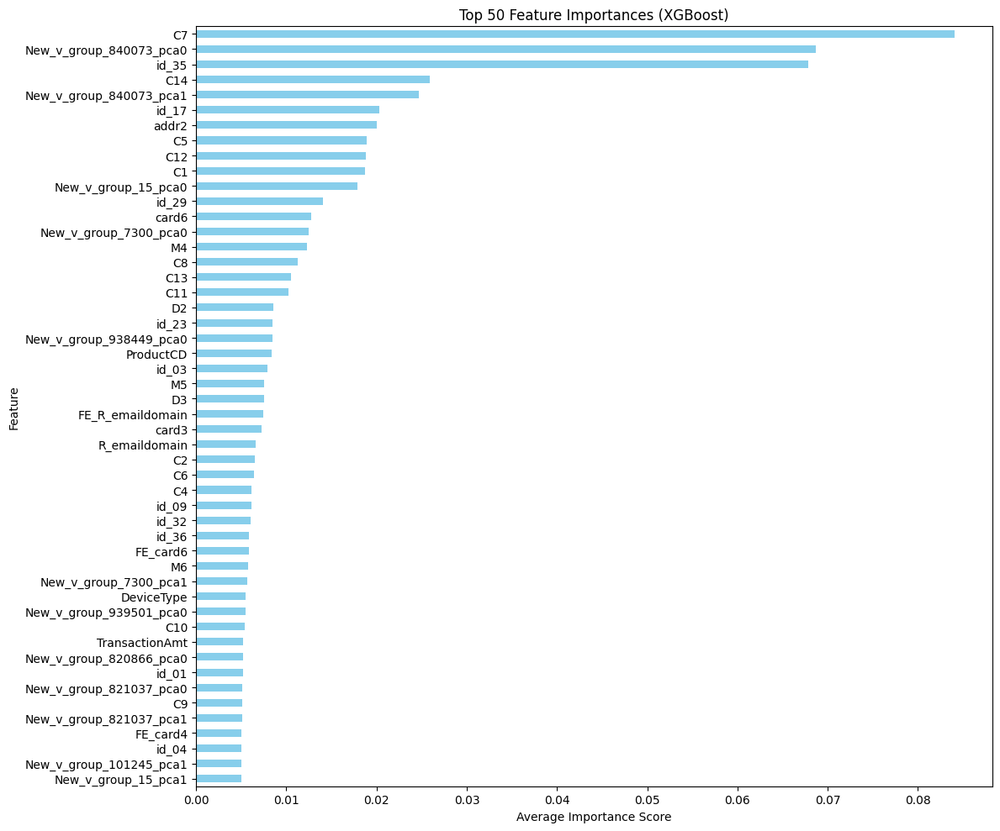


Top 50 features saved to 'xgb_top_50_features.csv'.


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc, precision_recall_curve
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier

# Preprocess data
train[features] = train[features].replace([np.inf, -np.inf], np.nan).fillna(0)
test[features] = test[features].replace([np.inf, -np.inf], np.nan).fillna(0)

folds = KFold(n_splits=3, shuffle=True, random_state=1001)

# Initialize placeholders
oof_preds_xgb = np.zeros(train.shape[0])
sub_preds_xgb = np.zeros(test.shape[0])

# Initialize lists to store metrics
precision_xgb_list = []
recall_xgb_list = []
f1_xgb_list = []
auc_xgb_list = []

# Placeholder for feature importance
feature_importance_df = pd.DataFrame()

# XGBoost parameters
xgb_params = {
    'n_estimators': 500,
    'max_depth': 9,
    'learning_rate': 0.05,
    'subsample': 0.9,
    'colsample_bytree': 0.9,
    'missing': -999,
    'random_state': 2019,
    'tree_method': 'hist',
    'objective': 'binary:logistic',
    'eval_metric': 'auc'
}

clf_xgb = XGBClassifier(**xgb_params)
for fold, (train_idx, valid_idx) in enumerate(folds.split(train[features], train[target])):
    print(f"Training Fold {fold + 1}...")
    X_train, y_train = train[features].iloc[train_idx], train[target].iloc[train_idx]
    X_valid, y_valid = train[features].iloc[valid_idx], train[target].iloc[valid_idx]

    clf_xgb.fit(
        X_train, y_train,
        eval_set=[(X_valid, y_valid)],
        early_stopping_rounds=100,
        verbose=False
    )

    # Predict probabilities and binary labels
    valid_probs = clf_xgb.predict_proba(X_valid)[:, 1]
    valid_preds = (valid_probs > 0.5).astype(int)

    # Store out-of-fold predictions
    oof_preds_xgb[valid_idx] = valid_probs
    sub_preds_xgb += clf_xgb.predict_proba(test[features])[:, 1] / folds.n_splits

    # Calculate metrics for the current fold
    precision = precision_score(y_valid, valid_preds)
    recall = recall_score(y_valid, valid_preds)
    f1 = f1_score(y_valid, valid_preds)
    fpr, tpr, _ = roc_curve(y_valid, valid_probs)
    roc_auc = auc(fpr, tpr)

    precision_xgb_list.append(precision)
    recall_xgb_list.append(recall)
    f1_xgb_list.append(f1)
    auc_xgb_list.append(roc_auc)

    print(f"  Fold {fold + 1} Precision: {precision:.6f}")
    print(f"  Fold {fold + 1} Recall: {recall:.6f}")
    print(f"  Fold {fold + 1} F1-Score: {f1:.6f}")
    print(f"  Fold {fold + 1} AUC: {roc_auc:.6f}")

    # Confusion matrix
    cm = confusion_matrix(y_valid, valid_preds)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
    plt.title(f'Confusion Matrix - Fold {fold + 1}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Accumulate feature importance for this fold
    fold_importance = pd.DataFrame()
    fold_importance["feature"] = features
    fold_importance["importance"] = clf_xgb.feature_importances_
    fold_importance["fold"] = fold + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance], axis=0)

# Calculate overall metrics
overall_precision = np.mean(precision_xgb_list)
overall_recall = np.mean(recall_xgb_list)
overall_f1 = np.mean(f1_xgb_list)
overall_auc = np.mean(auc_xgb_list)

# Display overall metrics
print(f"\nXGBoost Overall Metrics:")
print(f"Precision: {overall_precision:.6f}")
print(f"Recall: {overall_recall:.6f}")
print(f"F1-Score: {overall_f1:.6f}")
print(f"AUC: {overall_auc:.6f}")

# Average feature importance over all folds
avg_feature_importance = feature_importance_df.groupby("feature")["importance"].mean().sort_values(ascending=False)

# Get the top 50 features
top_50_features = avg_feature_importance.head(50)

# Plot the top 50 features
plt.figure(figsize=(12, 10))
top_50_features.sort_values().plot(kind="barh", color="skyblue")
plt.title("Top 50 Feature Importances (XGBoost)")
plt.xlabel("Average Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Save the top 50 features to a CSV file
top_50_features.to_csv("xgb_top_50_features.csv", header=True)
print("\nTop 50 features saved to 'xgb_top_50_features.csv'.")


## RandomForestClassifier

Training Fold 1...
  Fold 1 Precision: 0.958357
  Fold 1 Recall: 0.485141
  Fold 1 F1-Score: 0.644183
  Fold 1 AUC: 0.941549


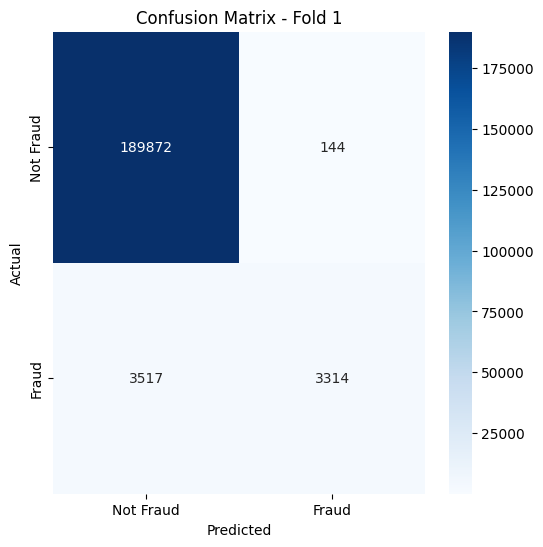

Training Fold 2...
  Fold 2 Precision: 0.955806
  Fold 2 Recall: 0.475294
  Fold 2 F1-Score: 0.634881
  Fold 2 AUC: 0.937134


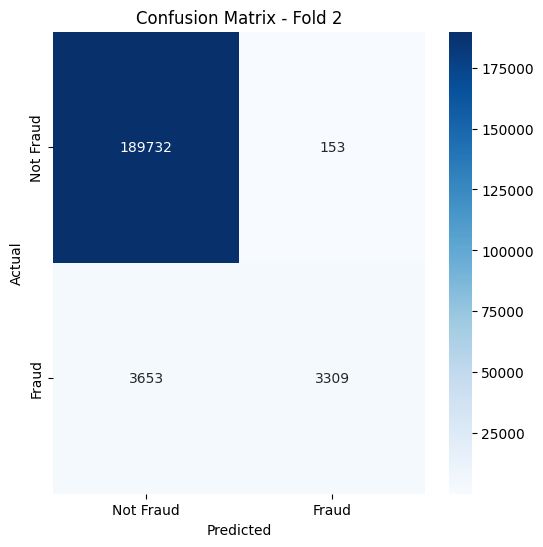

Training Fold 3...
  Fold 3 Precision: 0.962525
  Fold 3 Recall: 0.486026
  Fold 3 F1-Score: 0.645904
  Fold 3 AUC: 0.942841


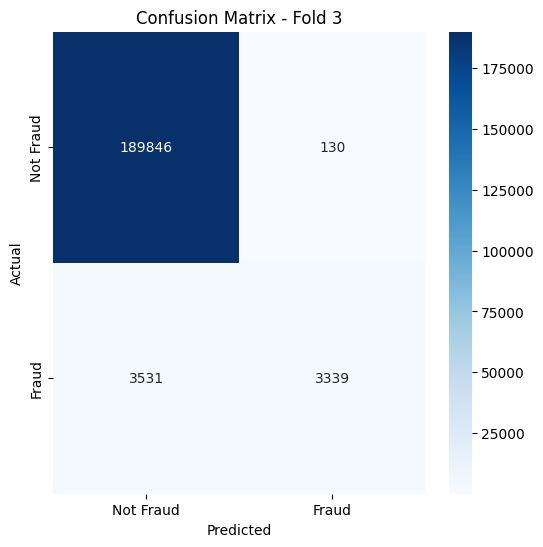


RandomForest Overall Metrics:
Precision: 0.958896
Recall: 0.482154
F1-Score: 0.641656
AUC: 0.940508


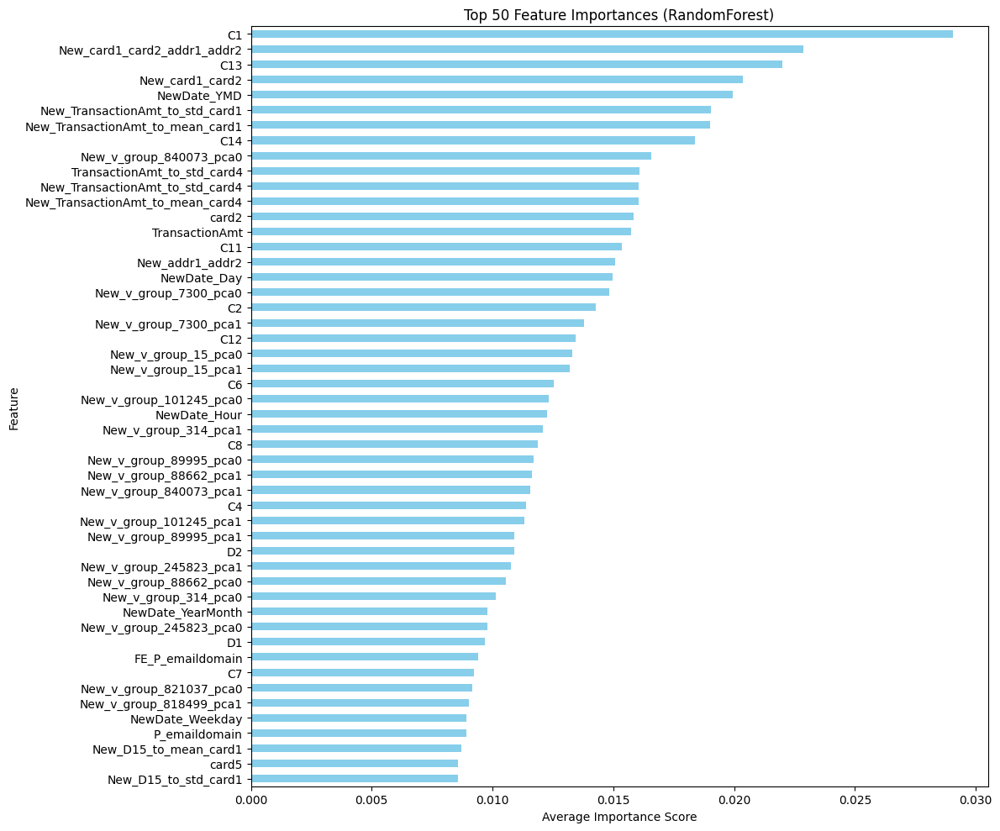


Top 50 features saved to 'rf_top_50_features.csv'.


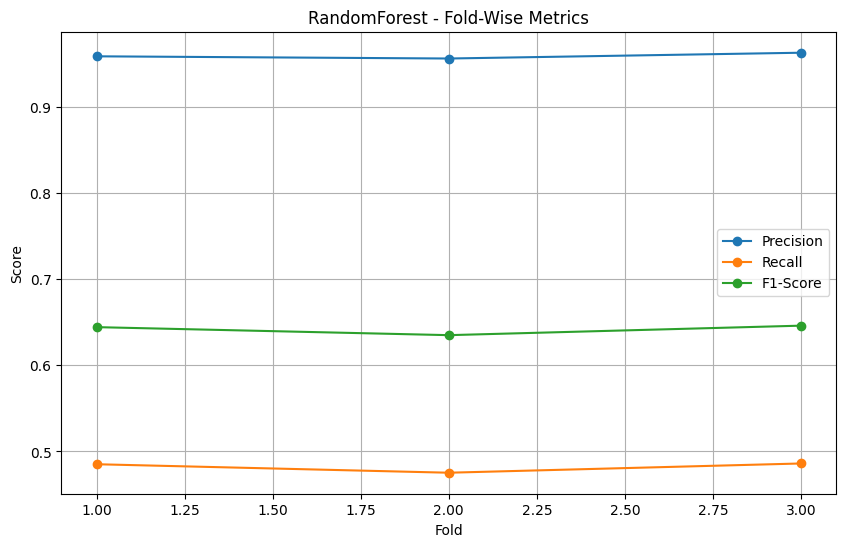

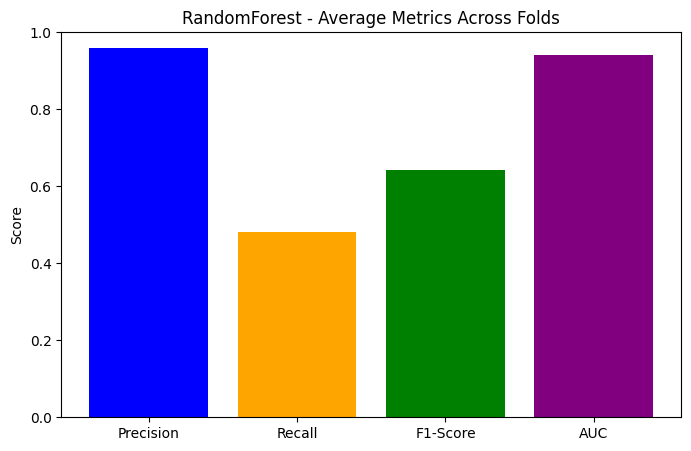

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Initialize arrays for out-of-fold predictions and test predictions
oof_preds_rf = np.zeros(train.shape[0])
sub_preds_rf = np.zeros(test.shape[0])

# Initialize lists to store metrics
precision_rf_list = []
recall_rf_list = []
f1_rf_list = []
auc_rf_list = []

# Placeholder for feature importance
feature_importance_df = pd.DataFrame()

# Initialize classifier
clf_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# KFold cross-validation
for fold, (train_idx, valid_idx) in enumerate(folds.split(train[features], train[target])):
    print(f"Training Fold {fold + 1}...")

    X_train, y_train = train[features].iloc[train_idx], train[target].iloc[train_idx]
    X_valid, y_valid = train[features].iloc[valid_idx], train[target].iloc[valid_idx]

    clf_rf.fit(X_train, y_train)
    valid_probs = clf_rf.predict_proba(X_valid)[:, 1]
    valid_preds = (valid_probs > 0.5).astype(int)  # Convert probabilities to binary predictions

    # Store out-of-fold predictions
    oof_preds_rf[valid_idx] = valid_probs
    sub_preds_rf += clf_rf.predict_proba(test[features])[:, 1] / folds.n_splits

    # Calculate metrics for the current fold
    precision = precision_score(y_valid, valid_preds)
    recall = recall_score(y_valid, valid_preds)
    f1 = f1_score(y_valid, valid_preds)
    auc = roc_auc_score(y_valid, valid_probs)

    precision_rf_list.append(precision)
    recall_rf_list.append(recall)
    f1_rf_list.append(f1)
    auc_rf_list.append(auc)

    print(f"  Fold {fold + 1} Precision: {precision:.6f}")
    print(f"  Fold {fold + 1} Recall: {recall:.6f}")
    print(f"  Fold {fold + 1} F1-Score: {f1:.6f}")
    print(f"  Fold {fold + 1} AUC: {auc:.6f}")

    # Confusion matrix
    cm = confusion_matrix(y_valid, valid_preds)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
    plt.title(f'Confusion Matrix - Fold {fold + 1}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Accumulate feature importance for this fold
    fold_importance = pd.DataFrame()
    fold_importance["feature"] = features
    fold_importance["importance"] = clf_rf.feature_importances_
    fold_importance["fold"] = fold + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance], axis=0)

# Calculate overall metrics
overall_auc = roc_auc_score(train[target], oof_preds_rf)
avg_precision = np.mean(precision_rf_list)
avg_recall = np.mean(recall_rf_list)
avg_f1 = np.mean(f1_rf_list)
avg_auc = np.mean(auc_rf_list)

# Display overall metrics
print(f"\nRandomForest Overall Metrics:")
print(f"Precision: {avg_precision:.6f}")
print(f"Recall: {avg_recall:.6f}")
print(f"F1-Score: {avg_f1:.6f}")
print(f"AUC: {avg_auc:.6f}")

# Average feature importance over all folds
avg_feature_importance = feature_importance_df.groupby("feature")["importance"].mean().sort_values(ascending=False)

# Get the top 50 features
top_50_features = avg_feature_importance.head(50)

# Plot the top 50 features
plt.figure(figsize=(12, 10))
top_50_features.sort_values().plot(kind="barh", color="skyblue")
plt.title("Top 50 Feature Importances (RandomForest)")
plt.xlabel("Average Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Save the top 50 features to a CSV file
top_50_features.to_csv("rf_top_50_features.csv", header=True)
print("\nTop 50 features saved to 'rf_top_50_features.csv'.")

# Visualization of metrics

# 1. Line Plot for Fold Metrics
folds_range = range(1, folds.n_splits + 1)
plt.figure(figsize=(10, 6))
plt.plot(folds_range, precision_rf_list, label="Precision", marker='o')
plt.plot(folds_range, recall_rf_list, label="Recall", marker='o')
plt.plot(folds_range, f1_rf_list, label="F1-Score", marker='o')
plt.title("RandomForest - Fold-Wise Metrics")
plt.xlabel("Fold")
plt.ylabel("Score")
plt.legend()
plt.grid()
plt.show()

# 2. Bar Plot for Average Metrics
avg_metrics = {"Precision": avg_precision, "Recall": avg_recall, "F1-Score": avg_f1, "AUC": avg_auc}
plt.figure(figsize=(8, 5))
plt.bar(avg_metrics.keys(), avg_metrics.values(), color=['blue', 'orange', 'green', 'purple'])
plt.title("RandomForest - Average Metrics Across Folds")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.show()


## CatBoostClassifier

Training Fold 1...
  Fold 1 Precision: 0.942899
  Fold 1 Recall: 0.476211
  Fold 1 F1-Score: 0.632818
  Fold 1 AUC: 0.941760


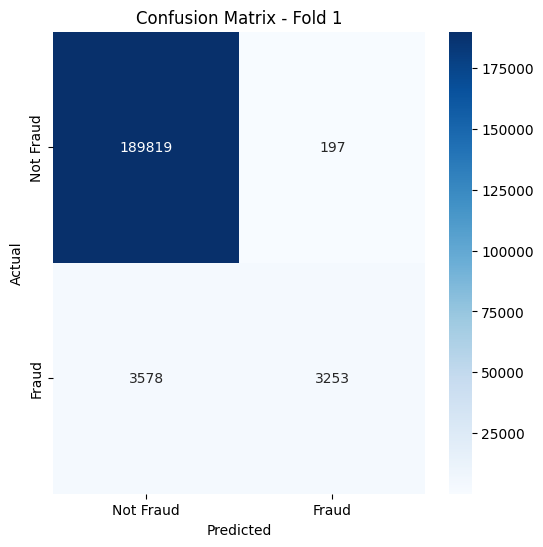

Training Fold 2...
  Fold 2 Precision: 0.937101
  Fold 2 Recall: 0.464378
  Fold 2 F1-Score: 0.621014
  Fold 2 AUC: 0.937344


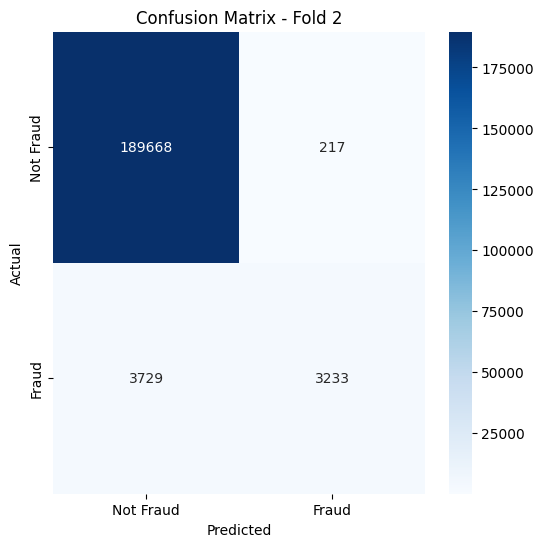

Training Fold 3...
  Fold 3 Precision: 0.940854
  Fold 3 Recall: 0.474672
  Fold 3 F1-Score: 0.630998
  Fold 3 AUC: 0.941217


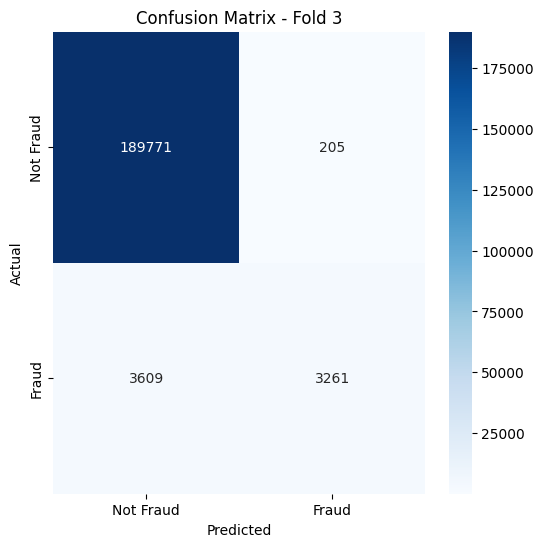


CatBoost Overall Metrics:
Precision: 0.940285
Recall: 0.471754
F1-Score: 0.628277
AUC: 0.940107


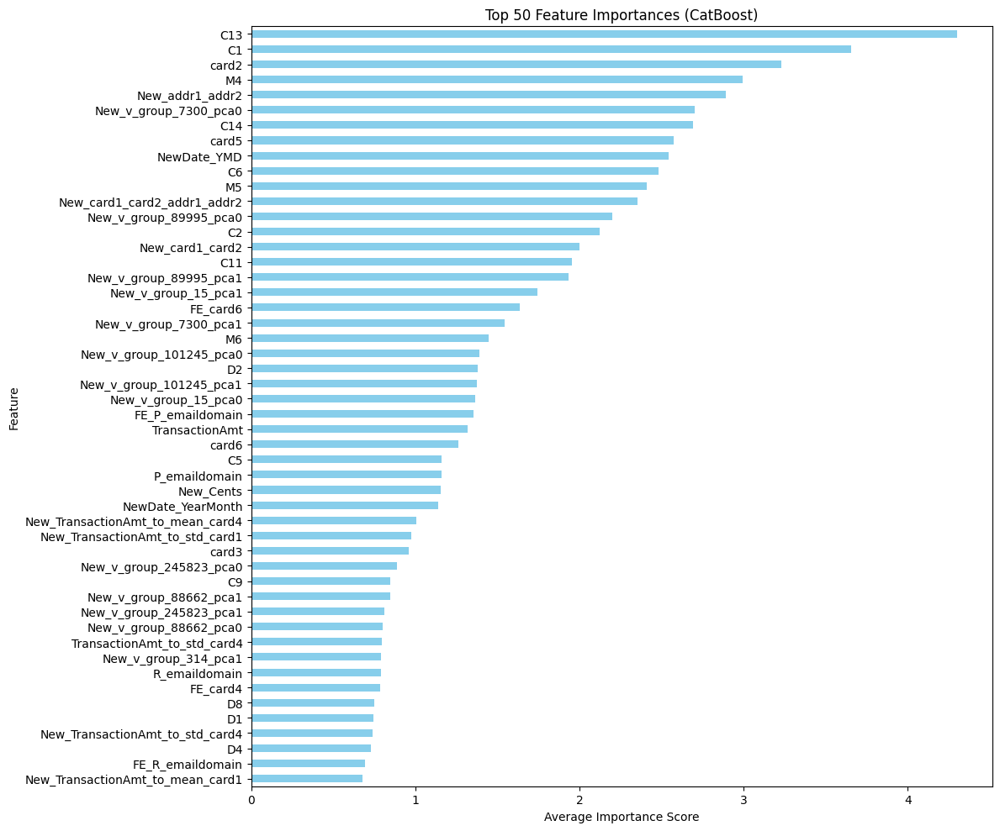


Top 50 features saved to 'catboost_top_50_features.csv'.


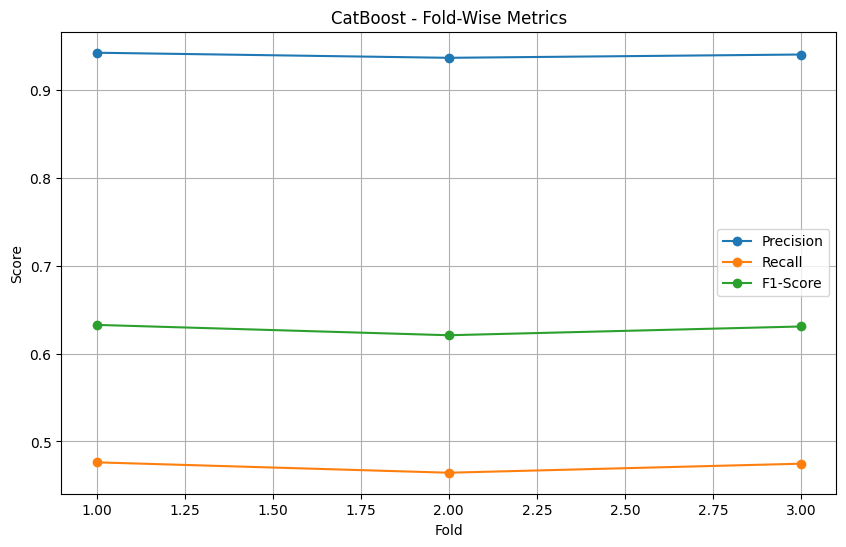

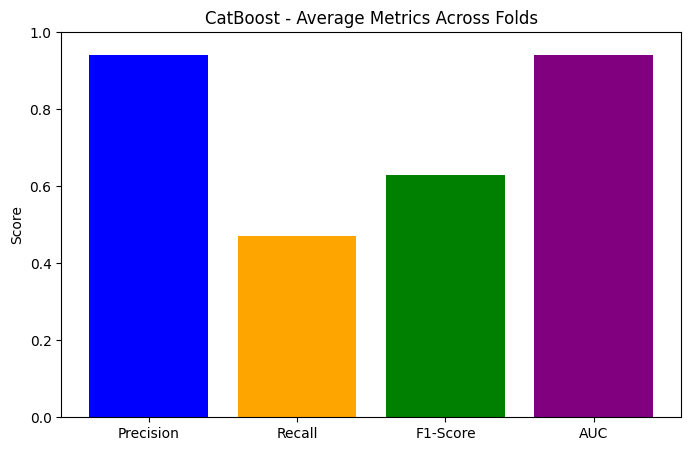

In [ ]:
from catboost import CatBoostClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Initialize arrays for out-of-fold predictions and test predictions
oof_preds_cat = np.zeros(train.shape[0])
sub_preds_cat = np.zeros(test.shape[0])

# Initialize lists to store metrics
precision_cat_list = []
recall_cat_list = []
f1_cat_list = []
auc_cat_list = []

# Placeholder for feature importance
feature_importance_df = pd.DataFrame()

# Initialize CatBoost parameters
cat_params = {
    'iterations': 500,
    'learning_rate': 0.05,
    'depth': 10,
    'loss_function': 'Logloss',
    'eval_metric': 'AUC',
    'random_seed': 42,
    'verbose': 0,
    'use_best_model': True
}

clf_cat = CatBoostClassifier(**cat_params)

# KFold cross-validation
for fold, (train_idx, valid_idx) in enumerate(folds.split(train[features], train[target])):
    print(f"Training Fold {fold + 1}...")

    X_train, y_train = train[features].iloc[train_idx], train[target].iloc[train_idx]
    X_valid, y_valid = train[features].iloc[valid_idx], train[target].iloc[valid_idx]

    clf_cat.fit(
        X_train, y_train,
        eval_set=(X_valid, y_valid),
        early_stopping_rounds=100
    )

    # Predict probabilities and binary labels
    valid_probs = clf_cat.predict_proba(X_valid)[:, 1]
    valid_preds = (valid_probs > 0.5).astype(int)  # Convert probabilities to binary predictions

    # Store out-of-fold predictions
    oof_preds_cat[valid_idx] = valid_probs
    sub_preds_cat += clf_cat.predict_proba(test[features])[:, 1] / folds.n_splits

    # Calculate metrics for the current fold
    precision = precision_score(y_valid, valid_preds)
    recall = recall_score(y_valid, valid_preds)
    f1 = f1_score(y_valid, valid_preds)
    auc = roc_auc_score(y_valid, valid_probs)

    precision_cat_list.append(precision)
    recall_cat_list.append(recall)
    f1_cat_list.append(f1)
    auc_cat_list.append(auc)

    print(f"  Fold {fold + 1} Precision: {precision:.6f}")
    print(f"  Fold {fold + 1} Recall: {recall:.6f}")
    print(f"  Fold {fold + 1} F1-Score: {f1:.6f}")
    print(f"  Fold {fold + 1} AUC: {auc:.6f}")

    # Confusion matrix
    cm = confusion_matrix(y_valid, valid_preds)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
    plt.title(f'Confusion Matrix - Fold {fold + 1}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Accumulate feature importance for this fold
    fold_importance = pd.DataFrame()
    fold_importance["feature"] = features
    fold_importance["importance"] = clf_cat.get_feature_importance()
    fold_importance["fold"] = fold + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance], axis=0)

# Calculate overall metrics
overall_auc = roc_auc_score(train[target], oof_preds_cat)
avg_precision = np.mean(precision_cat_list)
avg_recall = np.mean(recall_cat_list)
avg_f1 = np.mean(f1_cat_list)
avg_auc = np.mean(auc_cat_list)

# Display overall metrics
print(f"\nCatBoost Overall Metrics:")
print(f"Precision: {avg_precision:.6f}")
print(f"Recall: {avg_recall:.6f}")
print(f"F1-Score: {avg_f1:.6f}")
print(f"AUC: {avg_auc:.6f}")

# Average feature importance over all folds
avg_feature_importance = feature_importance_df.groupby("feature")["importance"].mean().sort_values(ascending=False)

# Get the top 50 features
top_50_features = avg_feature_importance.head(50)

# Plot the top 50 features
plt.figure(figsize=(12, 10))
top_50_features.sort_values().plot(kind="barh", color="skyblue")
plt.title("Top 50 Feature Importances (CatBoost)")
plt.xlabel("Average Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Save the top 50 features to a CSV file
top_50_features.to_csv("catboost_top_50_features.csv", header=True)
print("\nTop 50 features saved to 'catboost_top_50_features.csv'.")

# Visualization of metrics

# 1. Line Plot for Fold Metrics
folds_range = range(1, folds.n_splits + 1)
plt.figure(figsize=(10, 6))
plt.plot(folds_range, precision_cat_list, label="Precision", marker='o')
plt.plot(folds_range, recall_cat_list, label="Recall", marker='o')
plt.plot(folds_range, f1_cat_list, label="F1-Score", marker='o')
plt.title("CatBoost - Fold-Wise Metrics")
plt.xlabel("Fold")
plt.ylabel("Score")
plt.legend()
plt.grid()
plt.show()

# 2. Bar Plot for Average Metrics
avg_metrics = {"Precision": avg_precision, "Recall": avg_recall, "F1-Score": avg_f1, "AUC": avg_auc}
plt.figure(figsize=(8, 5))
plt.bar(avg_metrics.keys(), avg_metrics.values(), color=['blue', 'orange', 'green', 'purple'])
plt.title("CatBoost - Average Metrics Across Folds")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.show()


## LightGB with  training, validation accuracy

Training Fold 1...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.967411
  Fold 1 Training Accuracy: 0.992187
  Fold 1 Validation Accuracy: 0.984501
  Fold 1 Precision: 0.952153
  Fold 1 Recall: 0.582638
  Fold 1 F1-Score: 0.722913
  Fold 1 AUC: 0.967411


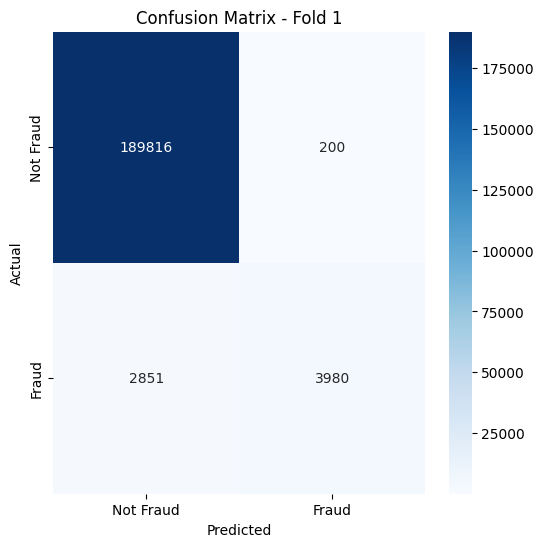

Training Fold 2...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.96332
  Fold 2 Training Accuracy: 0.991920
  Fold 2 Validation Accuracy: 0.983358
  Fold 2 Precision: 0.944954
  Fold 2 Recall: 0.562195
  Fold 2 F1-Score: 0.704971
  Fold 2 AUC: 0.963320


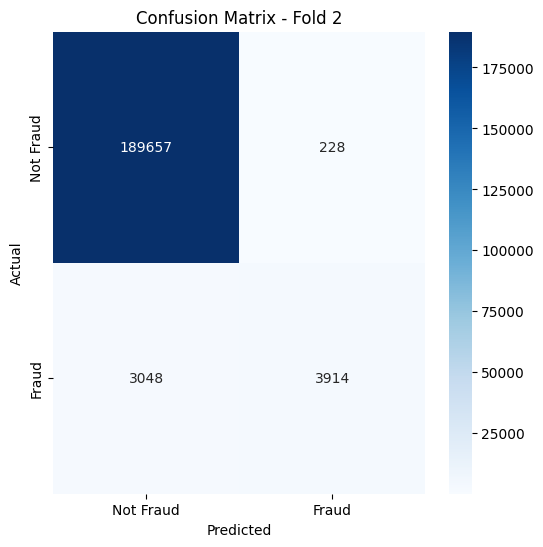

Training Fold 3...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.965863
  Fold 3 Training Accuracy: 0.991986
  Fold 3 Validation Accuracy: 0.983993
  Fold 3 Precision: 0.949480
  Fold 3 Recall: 0.571761
  Fold 3 F1-Score: 0.713728
  Fold 3 AUC: 0.965863


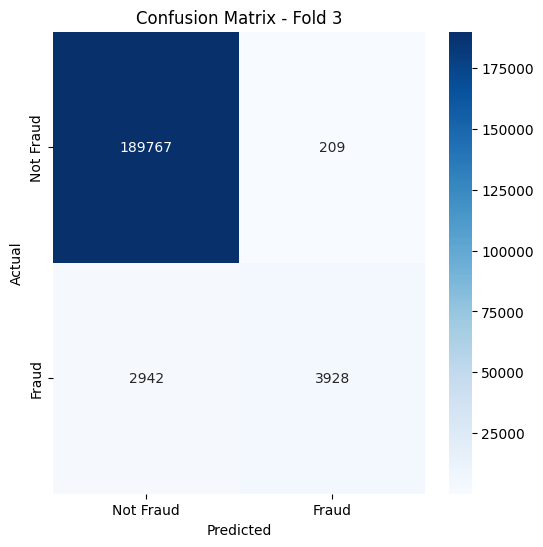


Overall Metrics:
Training Accuracy: 0.992031
Validation Accuracy: 0.983950
Precision: 0.948863
Recall: 0.572198
F1-Score: 0.713871
AUC: 0.965531


In [ ]:
# Initialize lists to store metrics
from sklearn.metrics import auc as sklearn_auc  # Avoid conflict by renaming during import

precision_lgb_list = []
recall_lgb_list = []
f1_lgb_list = []
auc_lgb_list = []
train_acc_list = []  # To store training accuracy
valid_acc_list = []  # To store validation accuracy

# Placeholder to accumulate feature importance across folds
feature_importance_df = pd.DataFrame()

clf_lgb = LGBMClassifier(**params)
for fold, (train_idx, valid_idx) in enumerate(folds.split(train[features], train[target])):
    print(f"Training Fold {fold + 1}...")

    X_train, y_train = train[features].iloc[train_idx], train[target].iloc[train_idx]
    X_valid, y_valid = train[features].iloc[valid_idx], train[target].iloc[valid_idx]

    clf_lgb.fit(
        X_train, y_train,
        eval_set=[(X_valid, y_valid)],
        eval_metric='auc',
        callbacks=[early_stopping(stopping_rounds=100)],
    )

    # Predict probabilities and binary labels
    valid_probs = clf_lgb.predict_proba(X_valid)[:, 1]
    valid_preds = (valid_probs > 0.5).astype(int)

    # Predict on training data for accuracy calculation
    train_preds = (clf_lgb.predict_proba(X_train)[:, 1] > 0.5).astype(int)

    # Store out-of-fold predictions
    oof_preds_lgb[valid_idx] = valid_probs
    sub_preds_lgb += clf_lgb.predict_proba(test[features])[:, 1] / folds.n_splits

    # Calculate metrics for the current fold
    train_acc = (train_preds == y_train).mean()
    valid_acc = (valid_preds == y_valid).mean()
    train_acc_list.append(train_acc)
    valid_acc_list.append(valid_acc)

    precision = precision_score(y_valid, valid_preds)
    recall = recall_score(y_valid, valid_preds)
    f1 = f1_score(y_valid, valid_preds)
    fpr, tpr, _ = roc_curve(y_valid, valid_probs)
    roc_auc = sklearn_auc(fpr, tpr)
    precision_lgb_list.append(precision)
    recall_lgb_list.append(recall)
    f1_lgb_list.append(f1)
    auc_lgb_list.append(roc_auc)

    print(f"  Fold {fold + 1} Training Accuracy: {train_acc:.6f}")
    print(f"  Fold {fold + 1} Validation Accuracy: {valid_acc:.6f}")
    print(f"  Fold {fold + 1} Precision: {precision:.6f}")
    print(f"  Fold {fold + 1} Recall: {recall:.6f}")
    print(f"  Fold {fold + 1} F1-Score: {f1:.6f}")
    print(f"  Fold {fold + 1} AUC: {roc_auc:.6f}")

    # Confusion matrix
    cm = confusion_matrix(y_valid, valid_preds)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
    plt.title(f'Confusion Matrix - Fold {fold + 1}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Accumulate feature importance for this fold
    fold_importance = pd.DataFrame()
    fold_importance["feature"] = features
    fold_importance["importance"] = clf_lgb.feature_importances_
    fold_importance["fold"] = fold + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance], axis=0)

# Calculate overall metrics
overall_precision = np.mean(precision_lgb_list)
overall_recall = np.mean(recall_lgb_list)
overall_f1 = np.mean(f1_lgb_list)
overall_auc = np.mean(auc_lgb_list)
overall_train_acc = np.mean(train_acc_list)
overall_valid_acc = np.mean(valid_acc_list)

# Display overall metrics
print(f"\nOverall Metrics:")
print(f"Training Accuracy: {overall_train_acc:.6f}")
print(f"Validation Accuracy: {overall_valid_acc:.6f}")
print(f"Precision: {overall_precision:.6f}")
print(f"Recall: {overall_recall:.6f}")
print(f"F1-Score: {overall_f1:.6f}")
print(f"AUC: {overall_auc:.6f}")


## Xgboost with  training, validation accuracy

Training Fold 1...
  Fold 1 Training Accuracy: 0.992164
  Fold 1 Validation Accuracy: 0.984861
  Fold 1 Precision: 0.956388
  Fold 1 Recall: 0.590690
  Fold 1 F1-Score: 0.730317
  Fold 1 AUC: 0.966635


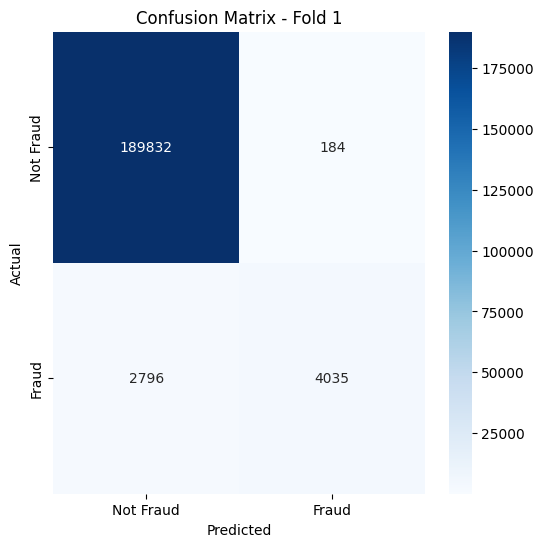

Training Fold 2...
  Fold 2 Training Accuracy: 0.991872
  Fold 2 Validation Accuracy: 0.983835
  Fold 2 Precision: 0.948505
  Fold 2 Recall: 0.574117
  Fold 2 F1-Score: 0.715283
  Fold 2 AUC: 0.962638


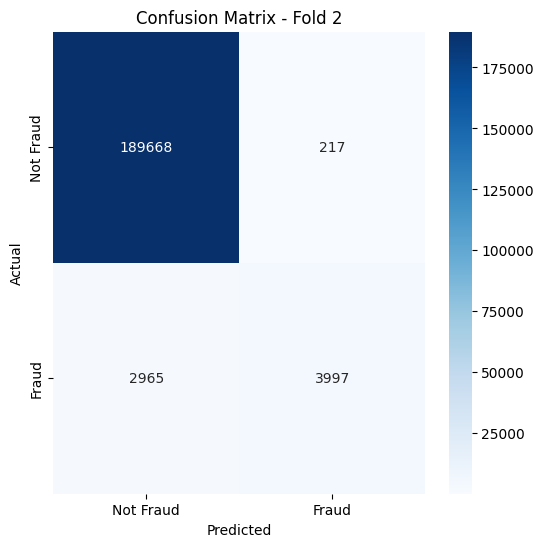

Training Fold 3...
  Fold 3 Training Accuracy: 0.991892
  Fold 3 Validation Accuracy: 0.984302
  Fold 3 Precision: 0.949786
  Fold 3 Recall: 0.580932
  Fold 3 F1-Score: 0.720918
  Fold 3 AUC: 0.964078


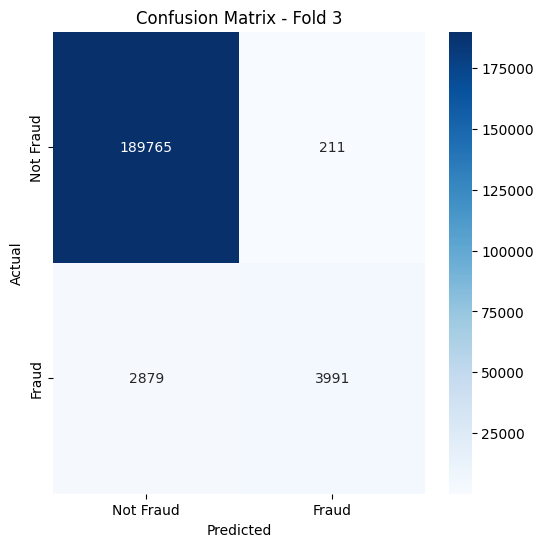


Overall Metrics:
Training Accuracy: 0.991976
Validation Accuracy: 0.984333
Precision: 0.951560
Recall: 0.581913
F1-Score: 0.722172
AUC: 0.964450


In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize lists to store metrics
precision_xgb_list = []
recall_xgb_list = []
f1_xgb_list = []
auc_xgb_list = []
train_acc_list = []  # To store training accuracy
valid_acc_list = []  # To store validation accuracy

# Placeholder to accumulate feature importance across folds
feature_importance_df = pd.DataFrame()

xgb_params = {
    'n_estimators': 500,
    'max_depth': 9,
    'learning_rate': 0.05,
    'subsample': 0.9,
    'colsample_bytree': 0.9,
    'missing': -999,
    'random_state': 2019,
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'use_label_encoder': False,
}

clf_xgb = XGBClassifier(**xgb_params)

for fold, (train_idx, valid_idx) in enumerate(folds.split(train[features], train[target])):
    print(f"Training Fold {fold + 1}...")

    X_train, y_train = train[features].iloc[train_idx], train[target].iloc[train_idx]
    X_valid, y_valid = train[features].iloc[valid_idx], train[target].iloc[valid_idx]

    clf_xgb.fit(
        X_train, y_train,
        eval_set=[(X_valid, y_valid)],
        early_stopping_rounds=100,
        verbose=False
    )

    # Predict probabilities and binary labels
    valid_probs = clf_xgb.predict_proba(X_valid)[:, 1]
    valid_preds = (valid_probs > 0.5).astype(int)

    # Predict on training data for accuracy calculation
    train_preds = (clf_xgb.predict_proba(X_train)[:, 1] > 0.5).astype(int)

    # Store out-of-fold predictions
    oof_preds_lgb[valid_idx] = valid_probs
    sub_preds_lgb += clf_xgb.predict_proba(test[features])[:, 1] / folds.n_splits

    # Calculate metrics for the current fold
    train_acc = (train_preds == y_train).mean()
    valid_acc = (valid_preds == y_valid).mean()
    train_acc_list.append(train_acc)
    valid_acc_list.append(valid_acc)

    precision = precision_score(y_valid, valid_preds)
    recall = recall_score(y_valid, valid_preds)
    f1 = f1_score(y_valid, valid_preds)
    fpr, tpr, _ = roc_curve(y_valid, valid_probs)
    roc_auc = auc(fpr, tpr)
    precision_xgb_list.append(precision)
    recall_xgb_list.append(recall)
    f1_xgb_list.append(f1)
    auc_xgb_list.append(roc_auc)

    print(f"  Fold {fold + 1} Training Accuracy: {train_acc:.6f}")
    print(f"  Fold {fold + 1} Validation Accuracy: {valid_acc:.6f}")
    print(f"  Fold {fold + 1} Precision: {precision:.6f}")
    print(f"  Fold {fold + 1} Recall: {recall:.6f}")
    print(f"  Fold {fold + 1} F1-Score: {f1:.6f}")
    print(f"  Fold {fold + 1} AUC: {roc_auc:.6f}")

    # Confusion matrix
    cm = confusion_matrix(y_valid, valid_preds)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
    plt.title(f'Confusion Matrix - Fold {fold + 1}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Accumulate feature importance for this fold
    fold_importance = pd.DataFrame()
    fold_importance["feature"] = features
    fold_importance["importance"] = clf_xgb.feature_importances_
    fold_importance["fold"] = fold + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance], axis=0)

# Calculate overall metrics
overall_precision = np.mean(precision_xgb_list)
overall_recall = np.mean(recall_xgb_list)
overall_f1 = np.mean(f1_xgb_list)
overall_auc = np.mean(auc_xgb_list)
overall_train_acc = np.mean(train_acc_list)
overall_valid_acc = np.mean(valid_acc_list)

# Display overall metrics
print(f"\nOverall Metrics:")
print(f"Training Accuracy: {overall_train_acc:.6f}")
print(f"Validation Accuracy: {overall_valid_acc:.6f}")
print(f"Precision: {overall_precision:.6f}")
print(f"Recall: {overall_recall:.6f}")
print(f"F1-Score: {overall_f1:.6f}")
print(f"AUC: {overall_auc:.6f}")
